In [21]:
__author__ = 'Sebastian F. Sanchez and LVM team'
__version__ = '20260414'
__datasets__ = ['SDSS-V LVM DAP (DRPVER=1.2.0, DAPVER = 1.2.0.251218, MJD=60191, EXPNUM=4297)']  
__keywords__ = ['Helix nebula']

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table
from astropy.table import vstack as tab_vstack
from lvmdap.dap_tools import list_columns,read_DAP_file,map_plot_DAP,scatter
from matplotlib import use as mpl_use
%matplotlib inline
from matplotlib import rcParams as rc
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\import matplotlib.colors as mpl_colors
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })
import math
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mpl_colors
from astropy.io import fits
from astropy.table import Table, vstack
import os
from pathlib import Path
import json
import re
import requests
import gdown

from sdss_access import Access
access = Access(release='dr20', verbose=True)


In [24]:
#
# Get the data using the sdss_access pachage
#
rsp = 'rsp108'
sn = 'sn20'
expnum = '00004297'
i_expnum = int(expnum)
drpver = "1.2.0"
dapver = '1.2.0.251218' 

access.remote()
kind = 'dap'
tileid = '11111'
mjd = 60191
expnum = 4297
access.add('lvm_dap', drpver = drpver, dapver = dapver, kind = kind, tileid = tileid, mjd = mjd, expnum = i_expnum)
access.set_stream()
access.commit()

# PATH to lvmDAP file
path_to_data_file = access.full('lvm_dap', drpver = drpver, dapver = dapver, kind = kind, tileid = tileid, mjd = mjd, expnum = i_expnum)

# Open data file and print a summary of the Header Data Units
fits.info(path_to_data_file)

[ERROR]: Traceback (most recent call last):
  File "/home/sanchez/miniconda3/envs/lvmdap/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3701, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_726160/627055494.py", line 16, in <module>
    access.add('lvm_dap', drpver = drpver, dapver = dapver, kind = kind, tileid = tileid, mjd = mjd, expnum = i_expnum)
  File "/home/sanchez/miniconda3/envs/lvmdap/lib/python3.11/site-packages/sdss_access/sync/baseaccess.py", line 50, in add
    location = self.location(filetype, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sanchez/miniconda3/envs/lvmdap/lib/python3.11/site-packages/sdss_access/path/path.py", line 1040, in location
    location = self._extract_location(filetype, base_dir=base_dir, **kwargs)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sanchez/miniconda3/envs/lvmdap/lib/python3.11/site-packages/sdss_access

authentication for netloc=data.sdss5.org set for username=sdss5


In [25]:
#
# Get the data from a local directory
#
DIR_CACHE = 'cache/'
DRVER = 'DR20'
DIR_DAP = 'dap_v1.2.0'
rsp = 'rsp108'
sn = 'sn20'
expnum = '00004297'
dap_file=f'dap-{rsp}-{sn}-{expnum}.dap.fits.gz'
dap_file=f'{DIR_DAP}/{dap_file}'
tab_DAP=read_DAP_file(dap_file,verbose=True)


  0%|          | 0.00/4.47M [23:39<?, ?B/s]


---- ALL Table Columns -----
-------------------------------
|        PT                   |
-------------------------------
id        dec       fiberid   
ra        mask      exposure  
----------------------------------
|        RSP                      |
----------------------------------
id             alpha          flux_st        Fe_MW          
MIN_CHISQ      e_alpha        redshift_st    e_Fe_MW        
Teff           Av_st          med_flux_st    alpha_MW       
e_Teff         e_Av_st        e_med_flux_st  e_alpha_MW     
Log_g          z_st           Teff_MW        vel_st         
e_Log_g        e_z_st         e_Teff_MW      log_ML         
Fe             disp_st        Log_g_MW       log_Mass       
e_Fe           e_disp_st      e_Log_g_MW                    
----------------------------------
|        PE_ord                   |
----------------------------------
id                 vel_pe_4340.49     e_disp_pe_6300.3   disp_pe_6716.44    
flux_pe_3726.03    e_vel_pe_4340.49 

In [26]:
def map_plot_DAP_rgb(tab_DAP,\
                     rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                     rgb_scale=(1.0,1.0,1.0),\
                 vmin=0, vmax=0, titles=('r','g','b'), filename='junk',\
                fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,fs=18):

    rc.update({'font.size': fs*fsize/5,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : fs*fsize/5,\
               'ytick.labelsize' : fs*fsize/5,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X= tab_DAP['ra'].value
    Y= tab_DAP['dec'].value
    R=tab_DAP[rgb_key[2]].value  
    G=tab_DAP[rgb_key[1]].value    
    B=tab_DAP[rgb_key[0]].value 
    R = R * rgb_scale[0]
    G = G * rgb_scale[1]
    B = B * rgb_scale[2]
    RGB = np.stack((R, G, B), axis=1)
    if (vmin==vmax):
        vmin=np.nanmin(RGB)
        vmax=np.nanmax(RGB)
    print(f'min/max:{vmin}/{vmax}')
    r = (R-vmin)/(vmax-vmin)
    g = (G-vmin)/(vmax-vmin)
    b = (B-vmin)/(vmax-vmin)

    r[r>1]=1
    r[r<0]=0
    b[b>1]=1
    b[b<0]=0
    r[r>1]=1
    r[r<0]=0    
    
    r = np.ma.filled(r, fill_value=0.0)
    g = np.ma.filled(g, fill_value=0.0)
    b = np.ma.filled(b, fill_value=0.0)

    r=r**gamma
    g=g**gamma
    b=b**gamma
    
#    print (r)
    r = np.ma.compressed(r)
    g = np.ma.compressed(g)
    b = np.ma.compressed(b)   


    #print(r,g,b)
    colors = np.stack((r, g, b), axis=1)
    colors[colors>1]=1
    colors[colors<0]=0
#    print(colors)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize*0.95))
#    norm=mpl_colors.PowerNorm(vmin=0,vmax=1,gamma=gamma)
    scatter(X, Y, ax, color=colors, size=sf*35.6/3600)#, color=colors)
    ax.set_xlabel('Ra [deg]')#,fontsize=21)
    ax.set_ylabel('Dec [deg]')#,fontsize=21)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.06*(yy[1]-yy[0]),titles[0],fontsize=fs*(fsize/5),color='tomato')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.12*(yy[1]-yy[0]),titles[1],fontsize=fs*(fsize/5),color='forestgreen')
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.18*(yy[1]-yy[0]),titles[2],fontsize=fs*(fsize/5),color='steelblue')

    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}', facecolor='white')
    plt.close()
    return colors

def search_col(tab,key):
    a_keys=[]
    for keys in tab.columns:
        if (keys.find(key)>-1):
            print(keys)
            a_keys.append(keys)
    return a_keys

In [28]:
search_col(tab_DAP,'[OII]')

flux_[OII]_3726.03
flux_[OII]_3728.82
vel_[OII]_3726.03
vel_[OII]_3728.82
disp_[OII]_3726.03
disp_[OII]_3728.82
EW_[OII]_3726.03
EW_[OII]_3728.82
e_flux_[OII]_3726.03
e_flux_[OII]_3728.82
e_vel_[OII]_3726.03
e_vel_[OII]_3728.82
e_disp_[OII]_3726.03
e_disp_[OII]_3728.82
e_EW_[OII]_3726.03
e_EW_[OII]_3728.82
flux_[OII]_7318.92
flux_[OII]_7329.66
vel_[OII]_7318.92
vel_[OII]_7329.66
disp_[OII]_7318.92
disp_[OII]_7329.66
EW_[OII]_7318.92
EW_[OII]_7329.66
e_flux_[OII]_7318.92
e_flux_[OII]_7329.66
e_vel_[OII]_7318.92
e_vel_[OII]_7329.66
e_disp_[OII]_7318.92
e_disp_[OII]_7329.66
e_EW_[OII]_7318.92
e_EW_[OII]_7329.66
sigma_kms_[OII]_3726.03
sigma_kms_[OII]_3728.82
sigma_kms_[OII]_7318.92
sigma_kms_[OII]_7329.66
X_sq_[OII]_3726.03
X_sq_[OII]_3728.82
X_sq_[OII]_7318.92
X_sq_[OII]_7329.66


['flux_[OII]_3726.03',
 'flux_[OII]_3728.82',
 'vel_[OII]_3726.03',
 'vel_[OII]_3728.82',
 'disp_[OII]_3726.03',
 'disp_[OII]_3728.82',
 'EW_[OII]_3726.03',
 'EW_[OII]_3728.82',
 'e_flux_[OII]_3726.03',
 'e_flux_[OII]_3728.82',
 'e_vel_[OII]_3726.03',
 'e_vel_[OII]_3728.82',
 'e_disp_[OII]_3726.03',
 'e_disp_[OII]_3728.82',
 'e_EW_[OII]_3726.03',
 'e_EW_[OII]_3728.82',
 'flux_[OII]_7318.92',
 'flux_[OII]_7329.66',
 'vel_[OII]_7318.92',
 'vel_[OII]_7329.66',
 'disp_[OII]_7318.92',
 'disp_[OII]_7329.66',
 'EW_[OII]_7318.92',
 'EW_[OII]_7329.66',
 'e_flux_[OII]_7318.92',
 'e_flux_[OII]_7329.66',
 'e_vel_[OII]_7318.92',
 'e_vel_[OII]_7329.66',
 'e_disp_[OII]_7318.92',
 'e_disp_[OII]_7329.66',
 'e_EW_[OII]_7318.92',
 'e_EW_[OII]_7329.66',
 'sigma_kms_[OII]_3726.03',
 'sigma_kms_[OII]_3728.82',
 'sigma_kms_[OII]_7318.92',
 'sigma_kms_[OII]_7329.66',
 'X_sq_[OII]_3726.03',
 'X_sq_[OII]_3728.82',
 'X_sq_[OII]_7318.92',
 'X_sq_[OII]_7329.66']

min/max:-1000/50000.0


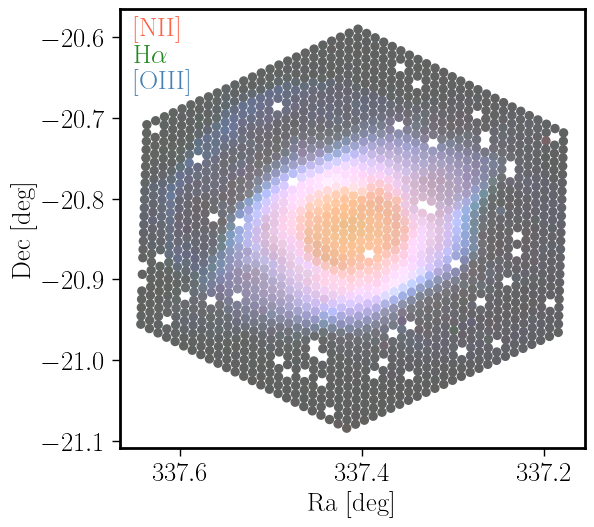

In [29]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_pe_6583.45','flux_pe_6562.85','flux_pe_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

min/max:-1000/50000.0


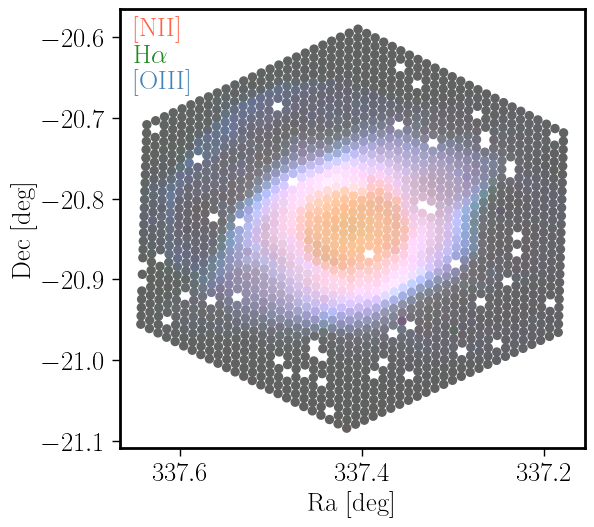

In [30]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_pek_6583.45','flux_pek_6562.85','flux_pek_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

min/max:-1000/50000.0


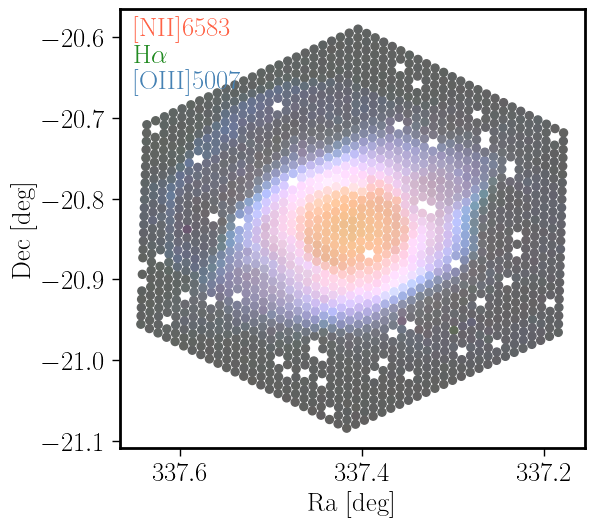

In [31]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_6583.45','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]6583',r'H$\alpha$','[OIII]5007'), filename='Helix_PN',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

[WARNING]: /tmp/ipykernel_726160/2202648745.py:61: RuntimeWarning: invalid value encountered in power
  g=g**gamma



min/max:-10/500.0


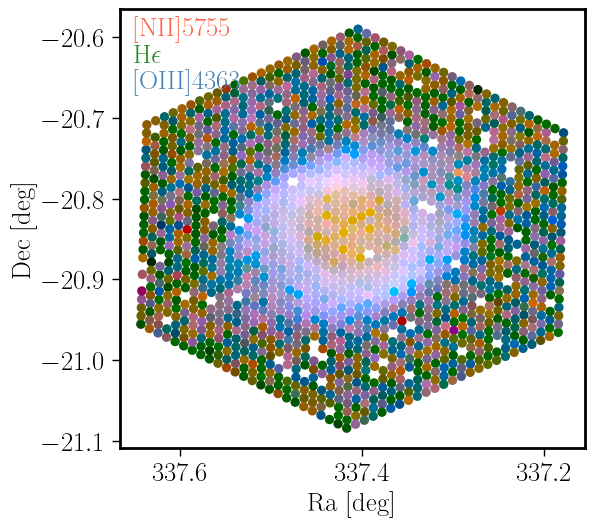

In [32]:
# 637.416/110230.7468
colors=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[NII]_5754.59','flux_Hepsilon_3970.07','flux_[OIII]_4363.21'), \
                 rgb_scale = (1,0.1,1), \
                 vmin=-10, vmax=500.0,\
                 titles=('[NII]5755',r'H$\epsilon$','[OIII]4363'), filename='Helix_PN_faint',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

min/max:-1000/50000.0


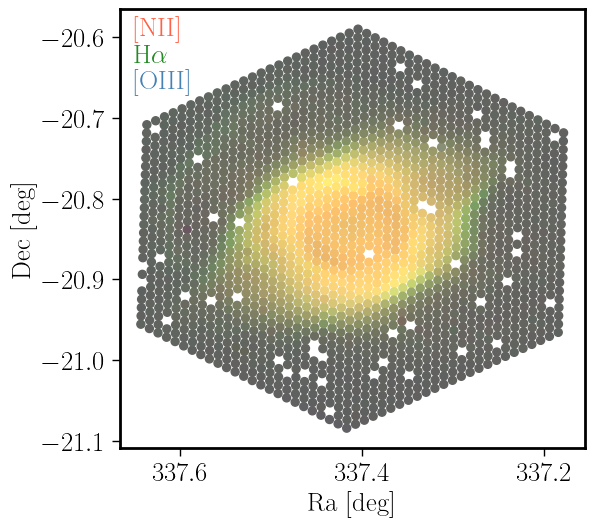

In [33]:
colors_t=map_plot_DAP_rgb(tab_DAP, \
                 rgb_key=('flux_[SIII]_9531.1','flux_Halpha_6562.85','flux_[OIII]_5006.84'), \
                 rgb_scale = (1,1,1), \
                 vmin=-1000, vmax=50000.0,\
                 titles=('[NII]',r'H$\alpha$','[OIII]'), filename='Helix_SIII',\
                 fsize=6, figs_dir='figs',gamma=0.25,fig_type='png',fs=16)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:56: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:57: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:58: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:59: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:60: RuntimeWarning: invalid value encountered in log10
  O2=np.log10(OII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_726160/4291635509.py:61: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))

[WARNING]: /tmp/ipykernel_726160/4291635509.py:62: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.

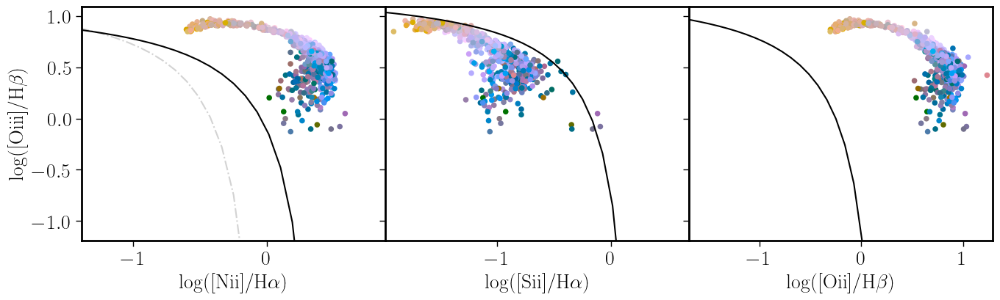

In [34]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
OII=tab_DAP['flux_[OII]_3726.03']+tab_DAP['flux_[OII]_3728.82']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
eOII=np.sqrt(tab_DAP['e_flux_[OII]_3726.03']**2+tab_DAP['e_flux_[OII]_3728.82']**2)
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
O2=np.log10(OII)-np.log10(Hb)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OII=0.73/((x-0.3))+1.33;#+1.10;
cut_y_OII_AGNs=1.18*(x)+0.36;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<0],cut_y3[x<0],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.5],cut_y4[x<0.5],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
axes[0,2].plot(x[x<0.3],cut_y_OII[x<0.3],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oii]/H$\beta$)')
axes[0,0].set_xlim(x_min1,x_max1)
axes[0,1].set_xlim(x_min1-0.6,x_max1-0.2)
axes[0,2].set_xlim(x_min1-0.3,x_max1+0.4)
axes[0,0].set_ylim(y_min1+0.1,y_max1+0.1)





plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_ORION.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

[WARNING]: /tmp/ipykernel_726160/683774227.py:54: RuntimeWarning: invalid value encountered in log10
  O3=np.log10(OIII)-np.log10(Hb)

[WARNING]: /tmp/ipykernel_726160/683774227.py:55: RuntimeWarning: invalid value encountered in log10
  N2=np.log10(NII)-np.log10(Ha)

[WARNING]: /tmp/ipykernel_726160/683774227.py:56: RuntimeWarning: invalid value encountered in log10
  S2=np.log10(SII/Ha)

[WARNING]: /tmp/ipykernel_726160/683774227.py:57: RuntimeWarning: invalid value encountered in log10
  O1=np.log10(OI/Ha)

[WARNING]: /tmp/ipykernel_726160/683774227.py:58: RuntimeWarning: divide by zero encountered in log10
  lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))

[WARNING]: /tmp/ipykernel_726160/683774227.py:59: RuntimeWarning: divide by zero encountered in divide
  e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])

[WARNING]: /tmp/ipykernel_726160/683774227.py:81: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7

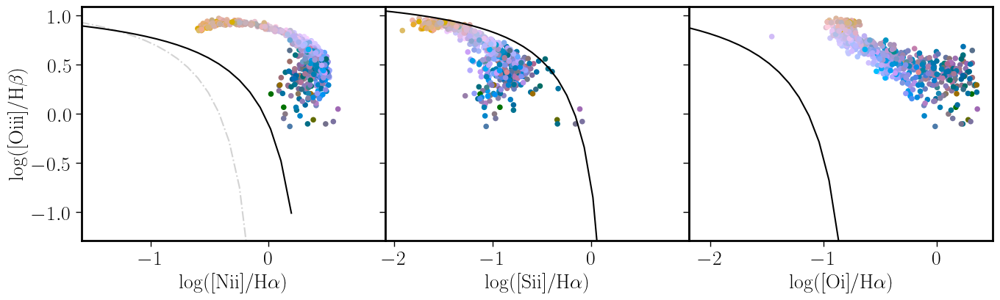

In [35]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


mask_Ha = (tab_DAP['flux_Halpha_6562.85']>100) & (tab_DAP['flux_Halpha_6562.85']>50.0*tab_DAP['e_flux_Halpha_6562.85'])



Ha=tab_DAP['flux_Halpha_6562.85']
Hb=tab_DAP['flux_Hbeta_4861.36']
OIII=tab_DAP['flux_[OIII]_5006.84']
NII=tab_DAP['flux_[NII]_6583.45']
SII=tab_DAP['flux_[SII]_6716.44']+tab_DAP['flux_[SII]_6730.82']
OI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['flux_pe_3726.03']+tab_DAP['flux_pe_3728.82']

map_dist=np.arange(len(Ha))

eHa=tab_DAP['e_flux_Halpha_6562.85']
eHb=tab_DAP['e_flux_Hbeta_4861.36']
eOIII=tab_DAP['e_flux_[OIII]_5006.84']
eNII=tab_DAP['e_flux_[NII]_6583.45']
eSII=np.sqrt(tab_DAP['e_flux_[SII]_6716.44']**2+tab_DAP['e_flux_[SII]_6730.82']**2)
eOI=tab_DAP['flux_[OI]_6300.3']
#tab_DAP['e_flux_pe_3726.03']+tab_DAP['e_flux_pe_3728.82']

#tab_DAP['e_flux_pe_9531.1']

O3=np.log10(OIII)-np.log10(Hb)
N2=np.log10(NII)-np.log10(Ha)
S2=np.log10(SII/Ha)
O1=np.log10(OI/Ha)
lEW_Ha = np.log10(np.abs(tab_DAP['EW_Halpha_6562.85']))
e_lEW_Ha = 0.4*np.abs(tab_DAP['e_EW_Halpha_6562.85']/tab_DAP['EW_Halpha_6562.85'])
nx = 2.5 #np.max(tab_DAP[mask_Ha]['R_Re'])
#
#
#
fig, axes = plt.subplots(1,3,figsize=(14,4.5), sharey=True, squeeze=False)
x_min1=-1.39
x_max1=0.89
y_min1=-1.29
y_max1=0.99

x=np.linspace(5*x_min1,2*x_max1,100)
cut_y=-0.7+0.2-3.67*x
cut_y2=-1.7+0.5-3.67*x
cut_y3=0.61/(x-0.05)+1.3
cut_y4=0.61/(x-0.47)+1.19
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII=0.61/(x-0.3)+1.3;
cut_y_SII_AGNs=1.89*(x)+0.76;
cut_y_OI=0.73/((x+0.59))+1.33;#+1.10;
cut_y_OI_AGNs=1.18*(x)+1.30;
cut_y_OIII_AGNs=1.14*(x)+0.36;
cm = plt.cm.get_cmap('viridis')
cax1=axes[0,0].scatter(N2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
#                       c=map_dist[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=0, vmax=nx)
cax2=axes[0,1].scatter(S2[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)
cax3=axes[0,2].scatter(O1[mask_Ha],O3[mask_Ha],color=colors[mask_Ha],edgecolor='None',s=30)

#axes[0,0].scatter(N2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,1].scatter(S2,O3,alpha=0.75, marker='*', s=100,c='green')
#axes[0,2].scatter(O1,O3,alpha=0.75, marker='*', s=100,c='green')

axes[0,0].plot(x[x<-0.1],cut_y3[x<-0.1],'-.',color='lightgrey')
axes[0,0].plot(x[x<0.2],cut_y4[x<0.2],'-',color='black')
axes[0,1].plot(x[x<0.2],cut_y_SII[x<0.2],'-',color='black')
axes[0,2].plot(x[x<-0.6],cut_y_OI[x<-0.6],'-',color='black')


#plt.rcParams.update({'font.size': 16})
axes[0,0].set_ylabel(r'log([Oiii]/H$\beta$)')
axes[0,0].set_xlabel(r'log([Nii]/H$\alpha$)')
axes[0,1].set_xlabel(r'log([Sii]/H$\alpha$)')
axes[0,2].set_xlabel(r'log([Oi]/H$\alpha$)')
axes[0,0].set_xlim(x_min1-0.2,x_max1+0.1)
axes[0,1].set_xlim(x_min1-0.7,x_max1+0.1)
axes[0,2].set_xlim(x_min1-0.8,x_max1-0.4)
axes[0,0].set_ylim(y_min1,y_max1+0.1)
axes[0,1].set_ylim(y_min1,y_max1+0.1)
axes[0,2].set_ylim(y_min1,y_max1+0.1)






plt.tight_layout()
plt.subplots_adjust(wspace=0)

fig.savefig(f'figs/BPT_HELIX_OI.png', facecolor='white')
plt.show()

#cax1=axes[0,2].scatter(N2[mask_Ha],O3[mask_Ha],c=log_EW_Ha[mask_Ha], marker='o', s=30, alpha=0.35, cmap=cm, vmin=-3, vmax=2.5)
#axes[0,2].plot(x[x<0],cut_y3[x<0],'r-.')
#axes[0,2].plot(x,cut_y4,'b-')
#cb1=add_colorbar(cax1)
#cb1.set_label(r'$log|EW(H\alpha)|$')

In [36]:
#
# Lines with enough S/N
#
#tab_sum_flux=Table()
name_cols=[]
w_sum = []
sum_flux=[]
e_sum_flux=[]


col_flux=search_col(tab_DAP,'flux_')
print ('------------------------------------\n')
#col_flux_np=[]
for cols in col_flux:
#    print (cols,cols.find('e_'))
    if ((cols.find('e_')==-1) and (cols.find('pe_')==-1) and (cols.find('st')==-1)  and (cols.find('pek_')==-1) ):
        a_cols=cols.split('_') 
        w_now=a_cols[-1]
        e_cols='e_'+cols
        name_cols.append(cols)
        w_sum.append(float(w_now))
        sum_flux_now=np.nansum(tab_DAP[cols])
        e_sum_flux_now=np.sqrt(np.nansum((tab_DAP[e_cols]**2)))
        sum_flux.append(sum_flux_now)
        e_sum_flux.append(e_sum_flux_now)

name_cols=np.array(name_cols)
sum_flux=np.array(sum_flux)
e_sum_flux=np.array(e_sum_flux)
tab_sum_flux=Table((name_cols,w_sum,sum_flux,e_sum_flux),names=('eline','wave','flux','e_flux'))


flux_st
med_flux_st
e_med_flux_st
flux_HI_3686.83
flux_HI_3691.56
flux_HI_3697.15
flux_HI_3703.85
flux_HI_3711.97
flux_[OII]_3726.03
flux_[OII]_3728.82
flux_HI_3734.37
flux_HI_3750.15
flux_[FeVII]_3758.9
flux_HI_3770.63
flux_HI_3797.9
flux_HeI_3819.61
flux_HI_3835.38
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_CaII_3933.66
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_HeI_4026.19
flux_[SII]_4068.6
flux_[SII]_4076.35
flux_Hdelta_4101.77
flux_HeI_4120.81
flux_[FeII]_4177.21
flux_[FeV]_4227.2
flux_[FeII]_4243.98
flux_CII_4267.0
flux_[FeII]_4287.4
flux_Hgamma_4340.49
flux_[FeII]_4358.1
flux_[FeII]_4358.37
flux_[FeII]_4359.34
flux_[OIII]_4363.21
flux_[FeII]_4413.78
flux_[FeII]_4414.45
flux_[FeII]_4416.27
flux_[FeII]_4452.11
flux_[FeII]_4457.95
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_[FeII]_4474.91
flux_[NiII]_4485.21
flux_[MgI]_4562.48
flux_MgI]_4571.1
flux_[FeII]_4632.27
flux_[FeIII]_4658.1
flux_HeII_4685.68
flux_[FeIII]_4701.62
flux_[A

In [37]:
print(len(tab_sum_flux))

215


In [38]:
#tab_sum_flux
SN = tab_sum_flux['flux']/tab_sum_flux['e_flux']
try:
    tab_sum_flux.add_column(SN,name='SN')
except:
    print('SN not needed')
tab_sum_flux_good = tab_sum_flux[SN>10]
print(len(tab_sum_flux_good))

tab_sum_flux.sort('flux',reverse=True)



tab_sum_flux[0:36]

55


eline,wave,flux,e_flux,SN
str21,float64,float64,float64,float64
flux_[NII]_6583.45,6583.45,15031632.71933053,30357.190326626216,495.15889176826494
flux_[OIII]_5006.84,5006.84,14964812.606783416,35324.58925435741,423.6372714493051
flux_Halpha_6562.85,6562.85,8373280.546647843,2012.2495545052002,4161.154131156849
flux_[OII]_3728.82,3728.82,7406704.644747626,4212.147465820748,1758.4153225519635
flux_[OII]_3726.03,3726.03,5520732.277634869,4531.687719648637,1218.2508193796987
flux_[OI]_6300.3,6300.3,4981429.135898313,2399.345648052597,2076.1615317665614
flux_[OIII]_4958.91,4958.91,4879187.688428344,104869.07246408734,46.52646937541317
flux_[NII]_6548.05,6548.05,4830567.780261527,91741.7869723707,52.65395344562363
flux_Hbeta_4861.36,4861.36,2853830.6822103066,7763.731282353152,367.5849380177573


In [39]:
tab_sum_flux_good

eline,wave,flux,e_flux,SN
str21,float64,float64,float64,float64
flux_[OII]_3726.03,3726.03,5520732.277634869,4531.687719648637,1218.2508193796987
flux_[OII]_3728.82,3728.82,7406704.644747626,4212.147465820748,1758.4153225519635
flux_[NeIII]_3868.75,3868.75,2372148.3208488086,5637.833540644658,420.75529611638115
flux_HeI_3888.65,3888.65,708317.5946264477,3303.7993432572825,214.39485908006236
flux_HI_3889.05,3889.05,682291.9749600517,3354.3452748510613,203.4054097160128
flux_HeI_3964.73,3964.73,40805.461790672605,3786.314599627957,10.777092266628385
flux_[NeIII]_3967.46,3967.46,812848.9313876929,2892.6788384036468,281.0021356661466
flux_CaII_3968.47,3968.47,652270.2231732791,3305.112382295749,197.35190448205233
flux_Hepsilon_3970.07,3970.07,485706.2376826094,3089.9316226281558,157.18996308063598


In [40]:
def map_plot_DAP(tab_DAP,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None):

    rc.update({'font.size': 19,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19,\
               'ytick.labelsize' : 19,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6,\
               'ytick.major.size'        :   6,\
               'xtick.minor.size'        :   3,\
               'ytick.minor.size'        :   3,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)
    print(line,vmin,vmax)
    fig,ax = plt.subplots(1,1,figsize=(fsize,fsize/1.3))
    norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
    scat=scatter(X, Y, ax, size=sf*35.6/3600, c=C, cmap=cmap, norm=norm)
#    scat=scatter(X, Y, ax, size=35.6/3600, c=C,vmin = vmin, vmax = vmax, cmap=cmap, norm=colors.PowerNorm(gamma=gamma))
    ax.set_xlabel('Ra [deg]')#,fontsize=21)
    ax.set_ylabel('Dec [deg]')#,fontsize=21)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*(yy[1]-yy[0]),title,color='black',\
            bbox=props)
    ax.text(xx[1]-0.52*(xx[1]-xx[0]),yy[0]+0.06*(yy[1]-yy[0]),r'10$^{-16}$ erg/s/cm$^2$',color='black',\
            bbox=props)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(scat.sc, cax=cax, format='%.0e')#,label=fr'{title}')#,fontsize=21)
    if (tab_pt != None):
        for tap_pt_now in tab_pt:
            ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
    try:
        plt.show()
    except:
        plt_show=False
    fig.tight_layout()
    fig.savefig(f'{figs_dir}/{filename}.{fig_type}')
    plt.close()


In [41]:
def map_plot_DAP_ax(tab_DAP,ax=None,fig=None,line='flux_Halpha_6562.85', \
                 vmin=0, vmax=0, title=None, filename='junk',\
                 cmap='Spectral', fsize=5, figs_dir='.',fig_type='png',\
                 gamma=1.0, sf=1.0, tab_pt=None,xlab=True,ylab=True, fs=1.0,f_scale=1e7):

    rc.update({'font.size': 19*fs,\
               'font.weight': 900,\
               'text.usetex': True,\
               'path.simplify'           :   True,\
               'xtick.labelsize' : 19*fs,\
               'ytick.labelsize' : 19*fs,\
               'axes.linewidth'  : 2.0,\
               'xtick.major.size'        :   6*fs,\
               'ytick.major.size'        :   6*fs,\
               'xtick.minor.size'        :   3*fs,\
               'ytick.minor.size'        :   3*fs,\
               'xtick.major.width'       :   1,\
               'ytick.major.width'       :   1,\
               'lines.markeredgewidth'   :   1,\
               'legend.numpoints'        :   1,\
               'xtick.minor.width'       :   1,\
               'ytick.minor.width'       :   1,\
               'legend.frameon'          :   False,\
               'legend.handletextpad'    :   0.3,\
               'font.family'    :   'serif',\
               'mathtext.fontset'        :   'stix',\
               'axes.facecolor' : "w",\
               })
    
    X=tab_DAP['ra']
    Y=tab_DAP['dec']
    C=tab_DAP[line]/f_scale    
    if (title== None):
        title=line.replace("_"," ")
        title=line.replace("_"," ")
    if (vmin==vmax):
        vmin=0.00001*np.nanmax(C)
        vmax=np.nanmax(C)
#    print(line,vmin,vmax)
    #fig,ax = plt.subplots(1,1,figsize=(fsize,fsize/1.3))
#    print(f'vmin/vmax:{vmin}/{vmax}')
    if (gamma>0):
        norm=mpl_colors.PowerNorm(vmin=vmin,vmax=vmax,gamma=gamma)
        size_sc = sf*35.6/3600
        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, norm=norm, rasterized=True)
    else:
#        print('PASO')
        scat=ax.scatter(X, Y, s=10*sf, c=C, cmap=cmap, vmin=vmin, vmax=vmax, rasterized=True)
#    scat=scatter(X, Y, ax=ax, size=sf*35.6/3600, c=C, cmap=cmap, norm=norm, rasterized=True)
#    scat=scatter(X, Y, ax, size=35.6/3600, c=C,vmin = vmin, vmax = vmax, cmap=cmap, norm=colors.PowerNorm(gamma=gamma))
    if (xlab == True):
        ax.set_xlabel('Ra [deg]',fontsize=19*fs)
    if (ylab == True):
        ax.set_ylabel('Dec [deg]',fontsize=19*fs)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    ax.set_xlim(xx[1],xx[0])
    props = dict(boxstyle='square', facecolor='white', alpha=0.5)
    ax.text(xx[1]-0.03*(xx[1]-xx[0]),yy[1]-0.08*fs*(yy[1]-yy[0]),rf'{title}',color='black',\
            bbox=props)
#    ax.text(xx[1]-0.52*(xx[1]-xx[0]),yy[0]+0.06*(yy[1]-yy[0]),r'10$^{-16}$ erg/s/cm$^2$',color='black',\
#            bbox=props)
    return scat
    #divider = make_axes_locatable(ax)
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    #plt.colorbar(scat, cax=cax, format='%.0e')#,label=fr'{title}')#,fontsize=21)
    #if (tab_pt != None):
    #    for tap_pt_now in tab_pt:
    #        ax.text(tab_pt['ra'],tab_pt['dec'],tab_pt['id'])
#    ax.set_aspect('equal', adjustable='box')
#    try:
#        plt.show()
#    except:
#        plt_show=False
#    fig.tight_layout()
#    fig.savefig(f'{figs_dir}/{filename}.{fig_type}')
#    plt.close()


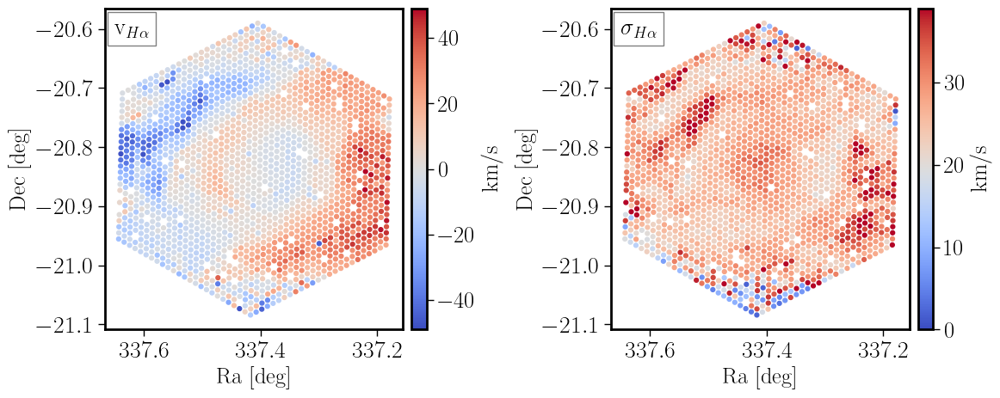

In [42]:
fig, axes = plt.subplots(1,2,figsize=(12,5))
#cmap_now = 'Spectral_r'
#cmap_now = 'turbo'
cmap_now = 'coolwarm'
#np.zeros(len(tab_DAP),dtype=int)
filename=f'Helix_{DRVER}_kin'
xlab = True
ylab = True
ax = axes[0]
mask_cen = ((tab_DAP['dec']>(-20.85-0.025)) & (tab_DAP['dec']<-20.85+0.025)) & ((tab_DAP['ra']>(337.40-0.05)) & (tab_DAP['ra']<(337.40+0.05)))        
mean_vel = np.nanmedian(tab_DAP['vel_pek_6562.85'][mask_cen])
tab_DAP['vel_off'] = tab_DAP['vel_pek_6562.85'] - mean_vel
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_off', \
                 vmin=-49, vmax=49, title=r'v$_{H\alpha}$', filename=filename,\
             cmap=cmap_now, fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)

ax = axes[1]
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='sigma_kms_pek_6562.85', \
                 vmin=0, vmax=39, title=r'$\sigma_{H\alpha}$', filename=filename,\
             cmap=cmap_now, fsize=6.5, figs_dir='figs',gamma=0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.2,fs=1.0,\
                        f_scale=1.0)

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)
fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)

#ax.set_ylabel('')


plt.tight_layout(w_pad=0.5)


fig.savefig(f'figs/kin.pdf', facecolor='white')


(array([  1.,   0.,   4.,   0.,   0.,   1.,   1.,   3.,   1.,   3.,   1.,
          3.,   4.,   2.,   2.,   1.,   1.,   3.,   2.,   0.,   0.,   4.,
          2.,   3.,   1.,   2.,   0.,   1.,   3.,   4.,   4.,   1.,   2.,
          5.,   3.,   2.,   9.,   8.,  11.,   6.,  13.,  26.,  29.,  42.,
         55.,  60.,  84.,  79.,  74.,  81.,  64.,  80.,  57.,  59.,  54.,
         97., 205.,  56.,  34.,  20.,  38.,  35.,  27.,  24.,  22.,  23.,
         13.,  22.,  14.,  17.,  11.,  13.,  12.,  17.,   7.,   7.,   9.,
          9.,   7.,   8.,   4.,   5.,  10.,   1.,   4.,   4.,   5.,   3.,
          3.,   1.,   1.,   0.,   2.,   0.,   1.,   1.,   0.,   0.,   0.,
          1.]),
 array([ 0.99411017,  1.47706115,  1.96001208,  2.44296312,  2.92591405,
         3.40886497,  3.8918159 ,  4.37476683,  4.85771799,  5.34066916,
         5.82361984,  6.30657101,  6.78952169,  7.27247286,  7.75542402,
         8.23837471,  8.72132587,  9.20427704,  9.68722725, 10.17017841,
        10.65312958, 11.13

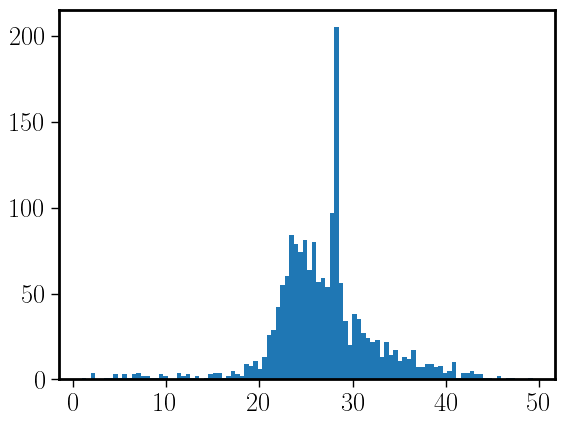

In [43]:
plt.hist(tab_DAP['sigma_kms_pek_6562.85'],bins=100)

Sky median [NII]6583.45: 1181.0137171696788 +/- 14963.506835391994  
Sky median [OIII]5006.84: 482.23112638589765 +/- 16339.476765449135  
Sky median H$\alpha$6562.85: 617.2109974944133 +/- 7600.284172591888  
Sky median [OII]3728.82: 734.9579283169076 +/- 7237.43974702756  
Sky median [OII]3726.03: 579.0777735923402 +/- 5381.026770435713  
Sky median [OI]6300.3: 2506.801805364504 +/- 832.3807635864367  ***
Sky median [OIII]4958.91: 154.79937973981123 +/- 5340.240673470719  
Sky median [NII]6548.05: 368.8091433981674 +/- 4855.144925506079  
Sky median H$\beta$4861.36: 229.05743214388167 +/- 2601.7211259647215  
Sky median [NeIII]3868.75: 157.0303092581225 +/- 2274.7504462373963  
Sky median [OI]5577.34: 1159.595216504849 +/- 134.0501026572485  ***
Sky median [OI]6363.78: 846.5883009848355 +/- 267.9741544006036  ***
Sky median H$\gamma$4340.49: 125.04565634667523 +/- 1188.7245536509504  
Sky median [NeIII]3967.46: 68.55128182356904 +/- 757.2739806064784  
Sky median H$\delta$4101.77: 11

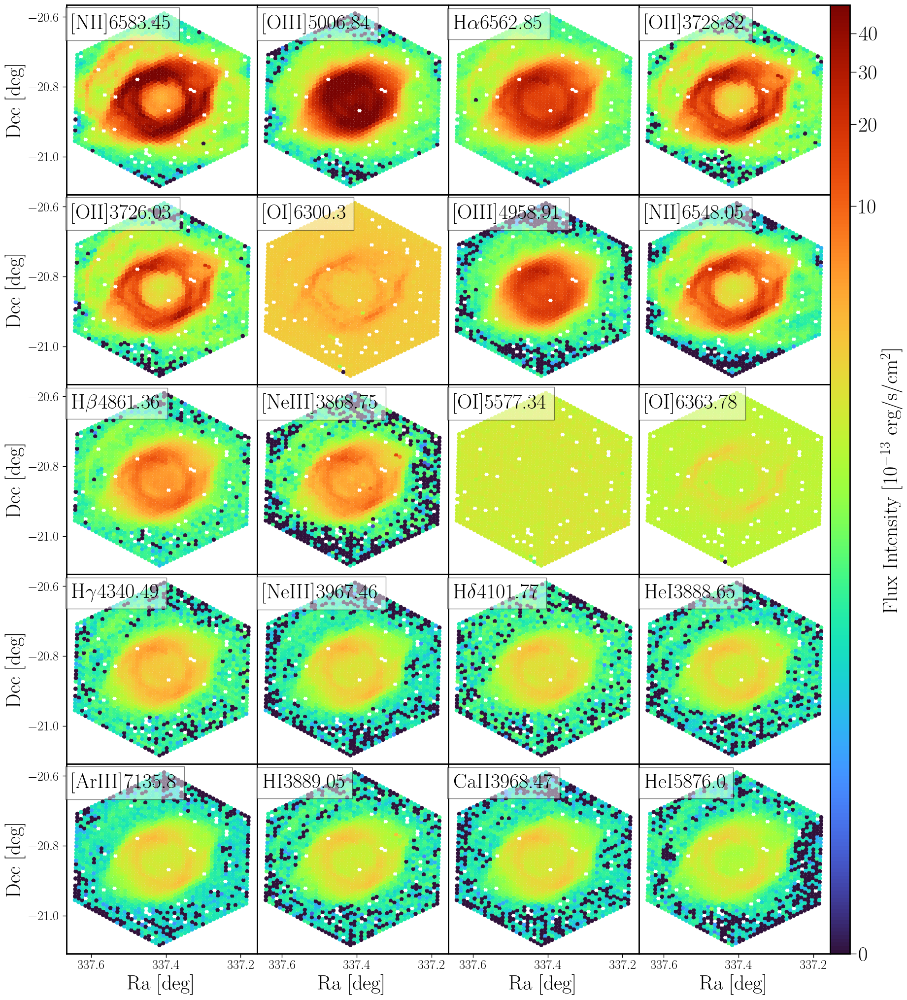

In [44]:
#cmap='gnuplot2_r'
gamma=0.15
#cmap='pink_r'
#cmap='Spectral'
#cmap='nipy_spectral_r'
#cmap='cubehelix_r'
#cmap='terrain_r'
#cmap = 'turbo_r'
cmap = 'turbo'
#cmap='gist_earth_r'
#fig = plt.figure()
NX=4
NY=5
fs=1.6
#f_scale=1e7
f_scale=1e3
fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


#axs_flat = axs.flatten
for I,ax in enumerate(np.ravel(axs)):
    #print(ax)
    tab_now=tab_sum_flux[I]
    eline=tab_now['eline']
    wave=np.ceil(tab_now['wave'])
    II=str(I)
    if (I<10):
        II='0'+str(I)
    filename=f'Helix_{II}_{wave}'
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    xlab = False
    ylab = False
    if ((I/NX)==int(I/NX)):
        ylab=True
    else:
        ax.set_yticks([])
    if (I>=(NX*NY-4)):
        xlab=True
    else:
        ax.set_xticks([])
    vmin=0
    vmax=0.49e5
#    vmax=8e5
    mask_sky = (tab_DAP['dec']<-20.5) | (tab_DAP['dec']>-21.2)

    med_sky = np.median(tab_DAP[eline][mask_sky])
    std_sky = np.std(tab_DAP[eline][mask_sky])
    if (med_sky>2*std_sky):
        label = '***'
    else:
        label = ''
    print(f'Sky median {title}: {med_sky} +/- {std_sky}  {label}')

    scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                 vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
    xx = ax.get_xlim()
    yy = ax.get_ylim()
    #print(xx,yy)
    
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("right", size="5%", pad=0.05)    
cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')

plt.subplots_adjust(wspace=0,hspace=0)
plt.show()    
#fig.tight_layout(w_pad=0.2)
fig.savefig(f'figs/Helix_felines.pdf', facecolor='white')

#if (I>3):
    #    break

In [45]:
mask_st = (tab_DAP['med_flux_st']>10) & (tab_DAP['med_flux_st']>5*tab_DAP['e_med_flux_st'])


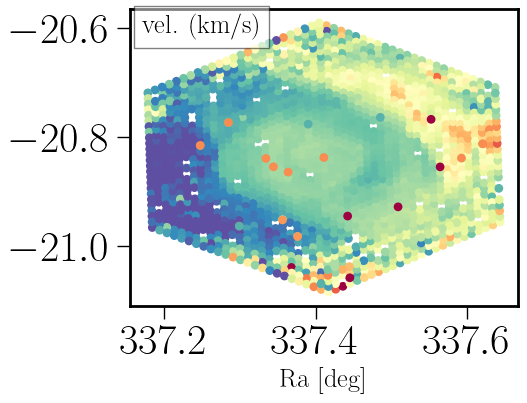

In [46]:
fs = 1.0
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
scat_vel_Ha=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_Halpha_6562.85', \
                 vmin=-100, vmax=0, title='', filename=filename,\
             cmap='Spectral', fsize=6.5, figs_dir='figs',gamma=1.0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=1.0)
scat=map_plot_DAP_ax(tab_DAP[mask_st],ax=ax,fig=fig,line='vel_st', \
                 vmin=-100, vmax=0, title='vel. (km/s)', filename=filename,\
             cmap='Spectral', fsize=6.5, figs_dir='figs',gamma=1.0,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=1.0)

In [47]:
tab_sum_flux_good

eline,wave,flux,e_flux,SN
str21,float64,float64,float64,float64
flux_[OII]_3726.03,3726.03,5520732.277634869,4531.687719648637,1218.2508193796987
flux_[OII]_3728.82,3728.82,7406704.644747626,4212.147465820748,1758.4153225519635
flux_[NeIII]_3868.75,3868.75,2372148.3208488086,5637.833540644658,420.75529611638115
flux_HeI_3888.65,3888.65,708317.5946264477,3303.7993432572825,214.39485908006236
flux_HI_3889.05,3889.05,682291.9749600517,3354.3452748510613,203.4054097160128
flux_HeI_3964.73,3964.73,40805.461790672605,3786.314599627957,10.777092266628385
flux_[NeIII]_3967.46,3967.46,812848.9313876929,2892.6788384036468,281.0021356661466
flux_CaII_3968.47,3968.47,652270.2231732791,3305.112382295749,197.35190448205233
flux_Hepsilon_3970.07,3970.07,485706.2376826094,3089.9316226281558,157.18996308063598


In [48]:
elines_pek = tab_sum_flux_good['eline'][[entry.find('_pek_') > -1 for entry in tab_sum_flux_good['eline']]]
elines_pe = tab_sum_flux_good['eline'][[entry.find('_pe_') > -1 for entry in tab_sum_flux_good['eline']]]
mask_pek = [entry in elines_pek for entry in tab_sum_flux_good['eline']]
mask_pe = [entry in elines_pe for entry in tab_sum_flux_good['eline']]
mask_np = ~ (np.array(mask_pek) | np.array(mask_pe))
tab_sum_flux_good['good'] = 1


In [49]:
#mask_np

# NP good lines:  55


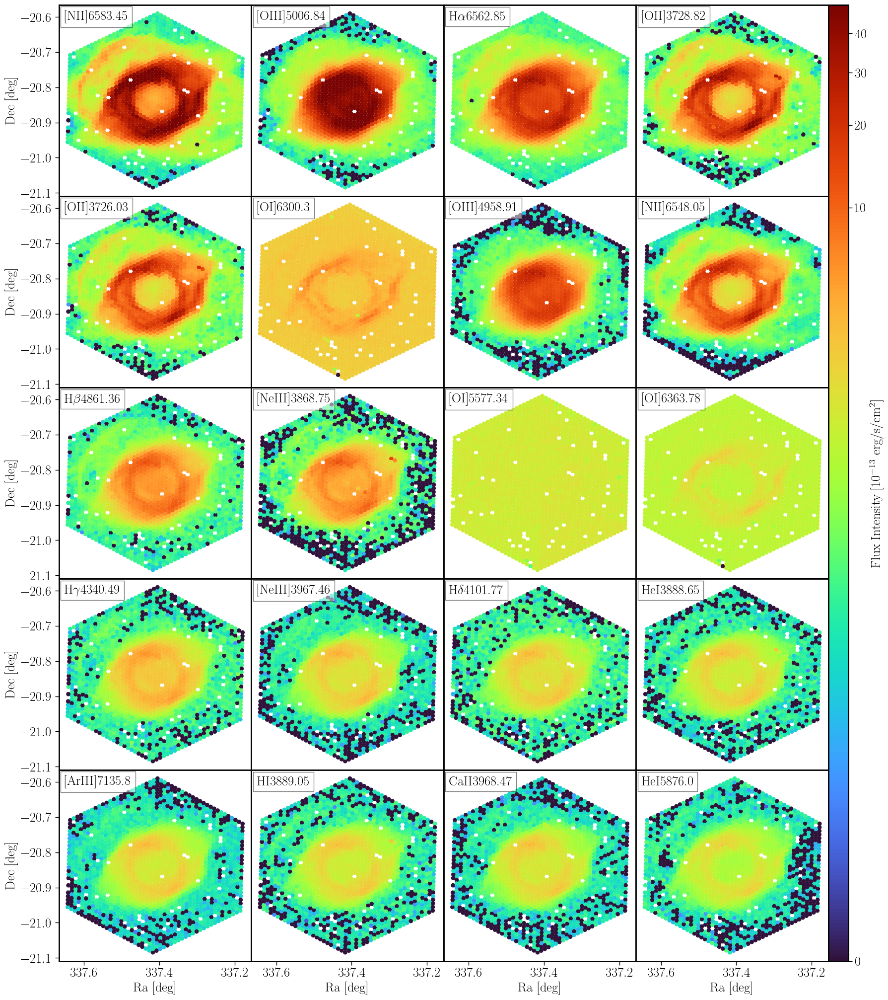

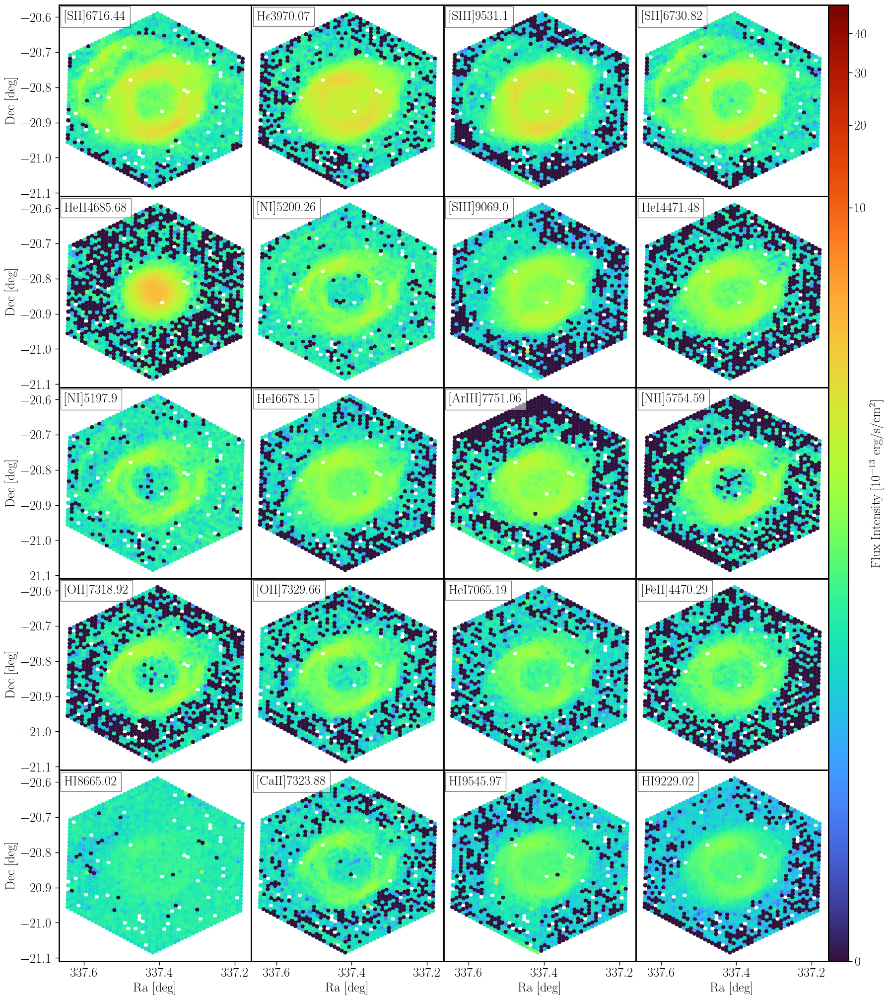

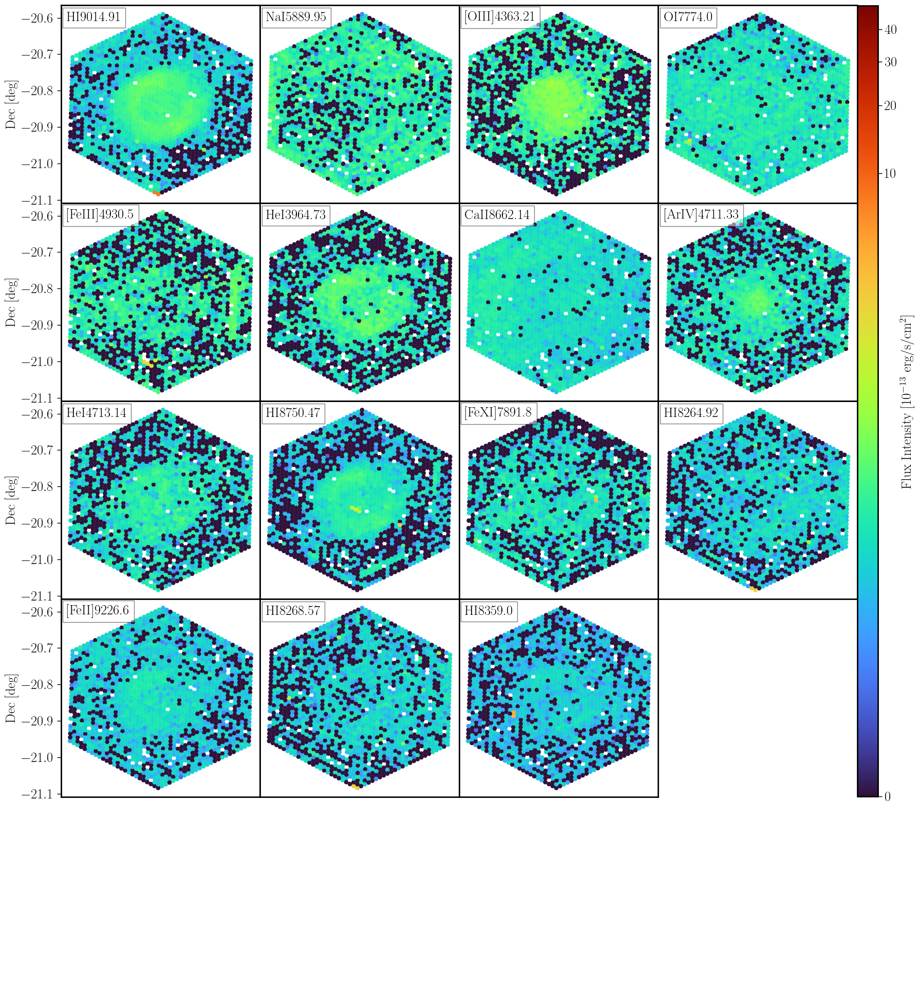

In [50]:

NX=4
NY=5
I_now=0

tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))
tab_sum_flux.sort('flux',reverse=True)
cax_pos = 1
for I0 in np.arange(0,len(tab_sum_flux),NX*NY):
    fig, axs = plt.subplots(nrows=NY, ncols=NX, figsize=(5*NX, 5*NY))#/1.3))


    #axs_flat = axs.flatten
    for I,ax in enumerate(np.ravel(axs)):
        #print(ax)
        I_now = I0 + I
        if (I_now >= len(tab_sum_flux)):
            ax.set_yticks([])
            ax.set_xticks([])
            ax.set_axis_off()
            cax_pos = 2

#            break
        else:
            tab_now=tab_sum_flux[I+I0]
            eline=tab_now['eline']
            wave=np.ceil(tab_now['wave'])
            II=str(I)
            if (I<10):
                II='0'+str(I)
            filename=f'Helix_{II}_{wave}'
            title=eline.replace('flux_','')
            title=title.replace('_','')
            title=title.replace('flux','')
            title=title.replace('alpha','$\\alpha$')
            title=title.replace('beta','$\\beta$')
            title=title.replace('gamma','$\\gamma$')    
            title=title.replace('delta','$\\delta$')
            title=title.replace('epsilon','$\\epsilon$')    
            xlab = False
            ylab = False
            if ((I/NX)==int(I/NX)):
                ylab=True
            else:
                ax.set_yticks([])
            if (I>=(NX*NY-4)):
                xlab=True
            else:
                ax.set_xticks([])                
            vmin=0
            vmax=0.49e5
        
            scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline, \
                             vmin=0.1/f_scale, vmax=vmax/f_scale, title=title, filename=filename,\
             cmap=cmap, fsize=6.5, figs_dir='figs',gamma=gamma,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=2.8,fs=fs,\
                        f_scale=f_scale)
        
#        scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line=eline,vmin=0, vmax=vmax, title=title, filename=filename, cmap=cmap, fsize=6.5,\
#                             figs_dir='figs',gamma=gamma,fig_type='pdf',xlab=xlab,ylab=ylab,sf=2.8)
        xx = ax.get_xlim()
        yy = ax.get_ylim()
        #print(xx,yy)
    if (cax_pos == 1):
        cax = fig.add_axes([0.9, 0.11, 0.02, 0.77])  # Ajusta estos valores según necesites
    else:
        cax = fig.add_axes([0.9, 0.2645, 0.02, 0.615])  # Ajusta estos valores según necesites
    #cax = fig.add_axes([0.9, 0.125, 0.02, 0.755])     
#    cax = fig.add_axes([0.9, 0.11, 0.02, 0.77]) 
#    cax = fig.add_axes([0.9, 0.125, 0.02, 0.76])  # Ajusta estos valores según necesites
    cbar = fig.colorbar(scat, cax=cax, ax=axs.ravel().tolist(), orientation='vertical')#, format='%.0e')
    cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
    plt.subplots_adjust(wspace=0,hspace=0)
    plt.show()    
    #fig.tight_layout(w_pad=0.2)
    fig.savefig(f'figs/Helix_felines_{I_now}.pdf', facecolor='white')
    I_now=I_now+1

#if (I>3):
    #    break

In [51]:
tab_sum_flux = tab_sum_flux_good[mask_np & (tab_sum_flux_good['good']==1)]
print('# NP good lines: ',len(tab_sum_flux))

# NP good lines:  55


In [52]:
tab_sec_sum = Table()
tab_sec_sum['eline'] = tab_sum_flux['eline']
tab_sec_sum.write(f'tables/m_Helix_{DRVER}_lines_sum.ecsv',format='ascii.ecsv',overwrite=True)

In [53]:
tab_sum_flux.colnames

['eline', 'wave', 'flux', 'e_flux', 'SN', 'good']

In [54]:
a_name=[]
a_flux=[]
a_e_flux=[]
n_cut = 0
for flux,e_flux,eline in zip(tab_sum_flux['flux'],tab_sum_flux['e_flux'],tab_sum_flux['eline']):
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')   
    a_name.append(title)
    a_flux.append(flux/1000)
    a_e_flux.append(e_flux/1000)
    n_cut=n_cut+1

a_name=np.array(a_name)
a_flux=np.array(a_flux)
a_e_flux=np.array(a_e_flux)
print(n_cut)

55


In [55]:
aa_name=[]
aa_wave=[]
#n_cut = 3
for I in range(n_cut):
    wave=''.join(filter(str.isdigit, a_name[I]))
    name=''.join(filter(lambda c: not c.isdigit(), a_name[I]))
    name = name.replace('.','')
    name = name.replace('[','$[$\ION{')
    name = name.replace(']','}{}$]$')

    if (len(wave)==5):
        wave = wave+'0'
    wave=np.around(float(wave)/100,2)
    print(f'{name} {wave}')
    aa_name.append(name)
    aa_wave.append(wave)
aa_name=np.array(aa_name)
aa_wave=np.array(aa_wave)

$[$\ION{OII}{}$]$ 3726.03
$[$\ION{OII}{}$]$ 3728.82
$[$\ION{NeIII}{}$]$ 3868.75
HeI 3888.65
HI 3889.05
HeI 3964.73
$[$\ION{NeIII}{}$]$ 3967.46
CaII 3968.47
H$\epsilon$ 3970.07
H$\delta$ 4101.77
H$\gamma$ 4340.49
$[$\ION{OIII}{}$]$ 4363.21
$[$\ION{FeII}{}$]$ 4470.29
HeI 4471.48
HeII 4685.68
$[$\ION{ArIV}{}$]$ 4711.33
HeI 4713.14
H$\beta$ 4861.36
$[$\ION{FeIII}{}$]$ 4930.5
$[$\ION{OIII}{}$]$ 4958.91
$[$\ION{OIII}{}$]$ 5006.84
$[$\ION{NI}{}$]$ 5197.9
$[$\ION{NI}{}$]$ 5200.26
$[$\ION{OI}{}$]$ 5577.34
$[$\ION{NII}{}$]$ 5754.59
HeI 5876.0
NaI 5889.95
$[$\ION{OI}{}$]$ 6300.3
$[$\ION{OI}{}$]$ 6363.78
$[$\ION{NII}{}$]$ 6548.05
H$\alpha$ 6562.85
$[$\ION{NII}{}$]$ 6583.45
HeI 6678.15
$[$\ION{SII}{}$]$ 6716.44
$[$\ION{SII}{}$]$ 6730.82
HeI 7065.19
$[$\ION{ArIII}{}$]$ 7135.8
$[$\ION{OII}{}$]$ 7318.92
$[$\ION{CaII}{}$]$ 7323.88
$[$\ION{OII}{}$]$ 7329.66
$[$\ION{ArIII}{}$]$ 7751.06
OI 7774.0
$[$\ION{FeXI}{}$]$ 7891.8
HI 8264.92
HI 8268.57
HI 8359.0
CaII 8662.14
HI 8665.02
HI 8750.47
HI 9014.91
$[$\IO

In [56]:
n_c=int(n_cut/3)+1
for I in range(n_c):
    print(' %s  &  %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I],aa_wave[I],a_flux[I],a_e_flux[I]),end='')
    print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f' % (aa_name[I+n_c],aa_wave[I+n_c],a_flux[I+n_c],a_e_flux[I+n_c]),end='')
    try:
        print('& %s  & %4.2f & %5.2f  $\pm$ %5.2f \\\\' % (aa_name[I+2*n_c],aa_wave[I+2*n_c],a_flux[I+2*n_c],a_e_flux[I+2*n_c]))
    except:
        print('')
    

 $[$\ION{OII}{}$]$  &  3726.03 & 5520.73  $\pm$  4.53& $[$\ION{OIII}{}$]$  & 4958.91 & 4879.19  $\pm$ 104.87& $[$\ION{CaII}{}$]$  & 7323.88 & 86.78  $\pm$  3.95 \\
 $[$\ION{OII}{}$]$  &  3728.82 & 7406.70  $\pm$  4.21& $[$\ION{OIII}{}$]$  & 5006.84 & 14964.81  $\pm$ 35.32& $[$\ION{OII}{}$]$  & 7329.66 & 121.84  $\pm$  2.99 \\
 $[$\ION{NeIII}{}$]$  &  3868.75 & 2372.15  $\pm$  5.64& $[$\ION{NI}{}$]$  & 5197.90 & 163.16  $\pm$  1.88& $[$\ION{ArIII}{}$]$  & 7751.06 & 160.32  $\pm$  5.23 \\
 HeI  &  3888.65 & 708.32  $\pm$  3.30& $[$\ION{NI}{}$]$  & 5200.26 & 185.81  $\pm$  1.90& OI  & 7774.00 & 58.65  $\pm$  3.04 \\
 HI  &  3889.05 & 682.29  $\pm$  3.35& $[$\ION{OI}{}$]$  & 5577.34 & 2026.05  $\pm$  2.50& $[$\ION{FeXI}{}$]$  & 7891.80 & 22.50  $\pm$  2.09 \\
 HeI  &  3964.73 & 40.81  $\pm$  3.79& $[$\ION{NII}{}$]$  & 5754.59 & 152.00  $\pm$  2.93& HI  & 8264.92 & 21.67  $\pm$  1.89 \\
 $[$\ION{NeIII}{}$]$  &  3967.46 & 812.85  $\pm$  2.89& HeI  & 5876.00 & 544.84  $\pm$  3.70& HI  & 8268.

In [57]:
for I in range(n_cut):
    if (a_name[I].find('beta')>-1):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        FHb = a_flux[I]
        e_FHb = a_e_flux[I]
        
for I in range(n_cut):
    if ((a_name[I].find('alpha')>-1) or (a_name[I].find('gamma')>-1) or (a_name[I].find('delta')>-1) or (a_name[I].find('epsilon')>-1) or (a_name[I].find('HI')>-1)):
#        print(' %s  & %5.2f  & %5.2f' % (a_name[I],a_flux[I],a_e_flux[I]))
        rat = a_flux[I]/FHb
        e_rat = a_e_flux[I]/FHb+e_FHb*rat/FHb
        print(' %s/H$\\beta$  & %5.2f $\pm$ %5.2f' % (a_name[I],rat,e_rat))
        
        

 HI3889.05/H$\beta$  &  0.24 $\pm$  0.00
 H$\epsilon$3970.07/H$\beta$  &  0.17 $\pm$  0.00
 H$\delta$4101.77/H$\beta$  &  0.27 $\pm$  0.00
 H$\gamma$4340.49/H$\beta$  &  0.46 $\pm$  0.00
 H$\alpha$6562.85/H$\beta$  &  2.93 $\pm$  0.01
 HI8264.92/H$\beta$  &  0.01 $\pm$  0.00
 HI8268.57/H$\beta$  &  0.01 $\pm$  0.00
 HI8359.0/H$\beta$  &  0.01 $\pm$  0.00
 HI8665.02/H$\beta$  &  0.03 $\pm$  0.00
 HI8750.47/H$\beta$  &  0.01 $\pm$  0.00
 HI9014.91/H$\beta$  &  0.02 $\pm$  0.00
 HI9229.02/H$\beta$  &  0.02 $\pm$  0.00
 HI9545.97/H$\beta$  &  0.03 $\pm$  0.00


In [58]:
#
# Stars with SN>5
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 5
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]

In [59]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


Text(0, 0.5, '[$\\alpha$/Fe]')

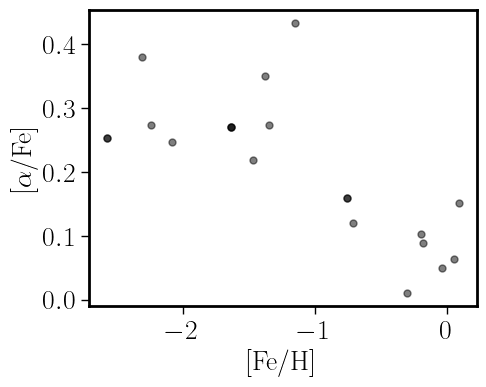

In [60]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],s=25,c='black',alpha=0.5)
ax.set_xlabel('[Fe/H]')
ax.set_ylabel(r'[$\alpha$/Fe]')

Text(0, 0.5, 'log(g)')

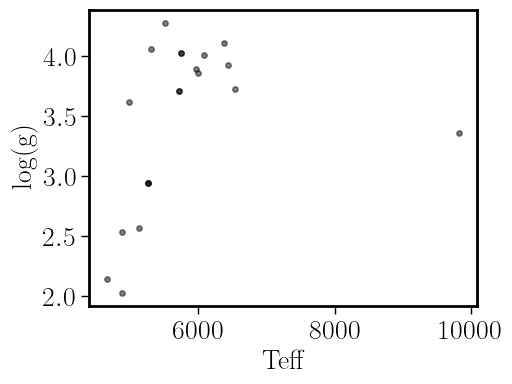

In [61]:
fig, ax = plt.subplots(1,1,figsize=(5,5/1.3))
ax.scatter(tab_DAP_st['Teff'],tab_DAP_st['Log_g'],s=15,c='black',alpha=0.5)
ax.set_xlabel('Teff')
ax.set_ylabel(r'log(g)')

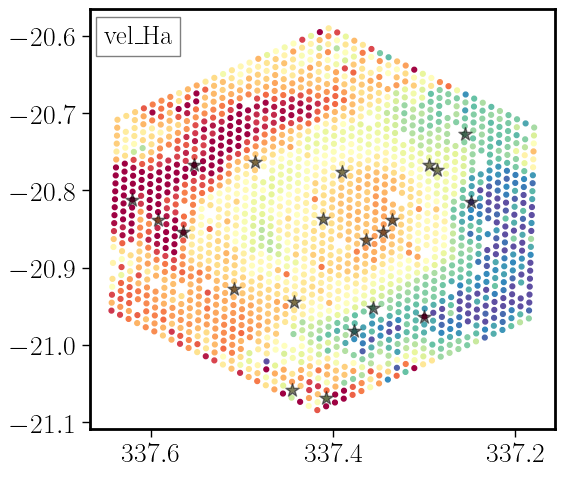

In [62]:
fig, ax = plt.subplots(1,1,figsize=(6,6/1.1))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='vel_pek_6562.85', \
                 vmin=-50, vmax=10, title='vel_Ha', filename=filename,\
             cmap='Spectral', fsize=3.5, figs_dir='figs',gamma=1,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.18,fs=fs,\
                        f_scale=1)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=100,marker='*',c='black',alpha=0.5)


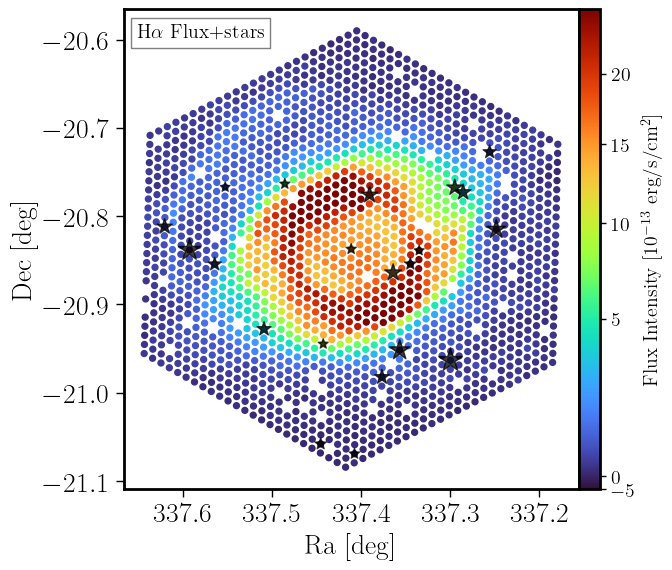

In [63]:
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

def add_inch_sized_axes(fig, *, width_in, height_in, left_margin_in, bottom_margin_in):
    """
    Exact inch sizing (useful for publication).
    """
    fig_w_in, fig_h_in = fig.get_size_inches()
    w_frac = width_in / fig_w_in
    h_frac = height_in / fig_h_in
    l_frac = left_margin_in / fig_w_in
    b_frac = bottom_margin_in / fig_h_in
    return fig.add_axes([l_frac, b_frac, w_frac, h_frac])

fig = plt.figure(figsize=(7, 6))
ax = fig.add_axes([0.17, 0.15, 0.65, 0.8])  # left, bottom, width, height
#fig, ax = plt.subplots(1,1,figsize=(7,6))
#np.zeros(len(tab_DAP),dtype=int)
scat=map_plot_DAP_ax(tab_DAP,ax=ax,fig=fig,line='flux_pek_6562.85', \
                 vmin=-100/f_scale, vmax=24999/f_scale, title=r'H$\alpha$ Flux+stars', filename=filename,\
             cmap='turbo', fsize=5.5, figs_dir='figs',gamma=0.65,fig_type='pdf',\
                         xlab=xlab,ylab=ylab,sf=1.8,fs=fs*0.75,\
                        f_scale=f_scale)


ax.scatter(tab_DAP_st['ra'],tab_DAP_st['dec'],s=2*(tab_DAP_st['SN_st'])*5,marker='*',c='black',\
           edgecolor='black',alpha=0.75)

#xcx= divider.append_axes("right", 0.15, pad=0.05)
cax = fig.add_axes([0.82, 0.15, 0.03, 0.8])  # Ajusta estos valores según necesites
cbar = fig.colorbar(scat, cax=cax, ax=ax, orientation='vertical')#, format='%.0e')
cbar.set_label('Flux Intensity [10$^{-13}$ erg/s/cm$^2$]')
ax.set_xlabel('Ra [deg]',fontsize=20)
ax.set_ylabel('Dec [deg]',fontsize=20)
#plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/Helix_{DRVER}_stars.pdf', facecolor='white')


In [64]:
from astropy.table import Table

# Calculate the Euclidean distance
tab_DAP_st['distance'] = ((tab_DAP_st['ra'] - 337.4)**2 + (tab_DAP_st['dec'] - (-20.85))**2)**0.5

# Find the row with the minimum distance
nearest_row = tab_DAP_st[np.argmin(tab_DAP_st['distance'])]

print(nearest_row)

   id            ra               dec         mask fiberid exposure     MIN_CHISQ             Teff       e_Teff       Log_g        e_Log_g          Fe         e_Fe        alpha        e_alpha        Av_st        e_Av_st           z_st          e_z_st     disp_st      e_disp_st      flux_st             redshift_st          med_flux_st       e_med_flux_st         Teff_MW      e_Teff_MW      Log_g_MW      e_Log_g_MW        Fe_MW        e_Fe_MW       alpha_MW      e_alpha_MW       vel_st            log_ML           log_Mass        flux_HI_3686.83     flux_HI_3691.56   flux_HI_3697.15   flux_HI_3703.85    flux_HI_3711.97   flux_[OII]_3726.03 flux_[OII]_3728.82   flux_HI_3734.37    flux_HI_3750.15  flux_[FeVII]_3758.9  flux_HI_3770.63     flux_HI_3797.9   flux_HeI_3819.61  flux_HI_3835.38   flux_[NeIII]_3868.75  flux_HeI_3888.65  flux_HI_3889.05   flux_CaII_3933.66  flux_HeI_3964.73  flux_[NeIII]_3967.46 flux_CaII_3968.47  flux_Hepsilon_3970.07  flux_HeI_4026.19  flux_[SII]_4068.6 flux_[SII]

(2.01, 3.3)

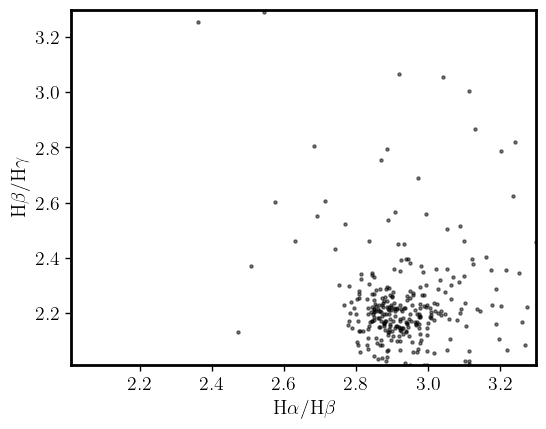

In [65]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pek_6562.85']/tab_DAP['e_flux_pek_6562.85'] > 30
ax.scatter((tab_DAP['flux_Halpha_6562.85']/tab_DAP['flux_Hbeta_4861.36'])[mask_SN_Ha],
           (tab_DAP['flux_Hbeta_4861.36']/tab_DAP['flux_Hgamma_4340.49'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'H$\alpha$/H$\beta$')
ax.set_ylabel(r'H$\beta$/H$\gamma$')
ax.set_xlim(2.01,3.3)
ax.set_ylim(2.01,3.3)
#ax.set_xlabel(r'H$\alpha$/H$\beta$')


(0.0, 2.5)

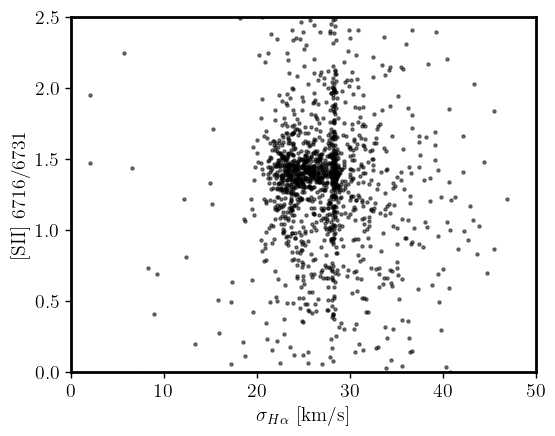

In [66]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           (tab_DAP['flux_[SII]_6716.44']/tab_DAP['flux_[SII]_6730.82'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[SII] 6716/6731')
ax.set_xlim(0,50)
ax.set_ylim(0,2.5)


[WARNING]: /tmp/ipykernel_726160/1376233549.py:5: RuntimeWarning: invalid value encountered in log10
  np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],



(0.0, 50.0)

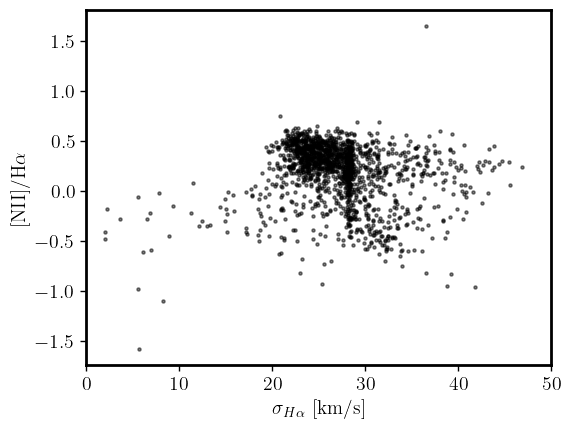

In [67]:
fig,ax = plt.subplots(1,1,figsize=(6,6/1.3))

mask_SN_Ha = tab_DAP['flux_pe_6562.85']/tab_DAP['e_flux_pe_6562.85'] > 3
ax.scatter((tab_DAP['sigma_kms_pek_6562.85'])[mask_SN_Ha],
           np.log10(tab_DAP['flux_pek_6583.45']/tab_DAP['flux_pek_6562.85'])[mask_SN_Ha],
           s=5,c='black',alpha=0.5)
ax.set_xlabel(r'$\sigma_{H\alpha}$ [km/s]')
ax.set_ylabel(r'[NII]/H$\alpha$')
ax.set_xlim(0,50)
#ax.set_ylim(0,2.5)

In [68]:
def rad_pro(ra_cen, dec_cen, tab_DAP, eline, delta_r, max_r, scale=1):
    ra = tab_DAP['ra']
    dec = tab_DAP['dec']
    r = np.sqrt((ra - ra_cen)**2 + (dec - dec_cen)**2)*scale
    n_r = int(max_r/delta_r)+1
    a_r = np.arange(n_r)*delta_r
    a_flux = np.zeros(n_r)
    a_e_flux = np.zeros(n_r)
    a_n = np.zeros(n_r,dtype=int)
    for I in range(n_r-1):
        if (I==0):
            mask_r = r <= a_r[I+1]
        else:
            mask_r = (r > a_r[I]) & (r <= a_r[I+1])
        a_n[I] = np.sum(mask_r)
        if (a_n[I]>0):
            a_flux[I] = np.nansum(tab_DAP[eline][mask_r])
            a_e_flux[I] = np.sqrt(np.nansum(tab_DAP[eline][mask_r]**2))
        else:
            a_flux[I] = 0
            a_e_flux[I] = 0
    return a_r, a_flux, a_e_flux, a_n

In [69]:
a_r, a_flux, a_e_flux, a_n = rad_pro(337.40479, -20.83775, tab_DAP, 'flux_pek_6562.85', 0.5, 25, scale=60)

In [70]:
search_col(tab_sum_flux,'flux_HeI_')
#print(tab_sum_flux['eline'])
#search_col(tab_DAP,'flux_')

[]

In [71]:
#


In [72]:
tab_DAP_cor = tab_DAP['id','ra','dec']
for cols in tab_sum_flux['eline']:
    e_cols = 'e_'+cols
    print(cols)
    tab_DAP_cor[cols] = tab_DAP[cols]
    tab_DAP_cor[e_cols] = tab_DAP[e_cols]
print(len(tab_DAP_cor.colnames))

flux_[OII]_3726.03
flux_[OII]_3728.82
flux_[NeIII]_3868.75
flux_HeI_3888.65
flux_HI_3889.05
flux_HeI_3964.73
flux_[NeIII]_3967.46
flux_CaII_3968.47
flux_Hepsilon_3970.07
flux_Hdelta_4101.77
flux_Hgamma_4340.49
flux_[OIII]_4363.21
flux_[FeII]_4470.29
flux_HeI_4471.48
flux_HeII_4685.68
flux_[ArIV]_4711.33
flux_HeI_4713.14
flux_Hbeta_4861.36
flux_[FeIII]_4930.5
flux_[OIII]_4958.91
flux_[OIII]_5006.84
flux_[NI]_5197.9
flux_[NI]_5200.26
flux_[OI]_5577.34
flux_[NII]_5754.59
flux_HeI_5876.0
flux_NaI_5889.95
flux_[OI]_6300.3
flux_[OI]_6363.78
flux_[NII]_6548.05
flux_Halpha_6562.85
flux_[NII]_6583.45
flux_HeI_6678.15
flux_[SII]_6716.44
flux_[SII]_6730.82
flux_HeI_7065.19
flux_[ArIII]_7135.8
flux_[OII]_7318.92
flux_[CaII]_7323.88
flux_[OII]_7329.66
flux_[ArIII]_7751.06
flux_OI_7774.0
flux_[FeXI]_7891.8
flux_HI_8264.92
flux_HI_8268.57
flux_HI_8359.0
flux_CaII_8662.14
flux_HI_8665.02
flux_HI_8750.47
flux_HI_9014.91
flux_[SIII]_9069.0
flux_[FeII]_9226.6
flux_HI_9229.02
flux_[SIII]_9531.1
flux_HI_95

In [73]:
#print(len(tab_DAP_cor))

In [74]:
tab_DAP_add = tab_DAP_cor.copy()

#flux_[OII]_3726.03
#flux_[OII]_3728.82

tab_DAP_add['OII'] = tab_DAP_cor['flux_[OII]_3726.03'] + tab_DAP_cor['flux_[OII]_3728.82']
tab_DAP_add['e_OII'] = np.sqrt(tab_DAP_cor['e_flux_[OII]_3726.03']**2 + tab_DAP_cor['e_flux_[OII]_3728.82']**2)
tab_DAP_add['SII'] = tab_DAP_cor['flux_[SII]_6716.44'] + tab_DAP_cor['flux_[SII]_6730.82']
tab_DAP_add['e_SII'] = np.sqrt(tab_DAP_cor['e_flux_[SII]_6716.44']**2 + tab_DAP_cor['e_flux_[SII]_6730.82']**2)



In [75]:
search_col(tab_DAP_add,'SIII')

flux_[SIII]_9069.0
e_flux_[SIII]_9069.0
flux_[SIII]_9531.1
e_flux_[SIII]_9531.1


['flux_[SIII]_9069.0',
 'e_flux_[SIII]_9069.0',
 'flux_[SIII]_9531.1',
 'e_flux_[SIII]_9531.1']

In [76]:
search_col(tab_DAP_add,'flux_HeI_')

#flux_HeI_6678.15
#tab_DAP_add
#['flux_HeI_6678.15']

flux_HeI_3888.65
e_flux_HeI_3888.65
flux_HeI_3964.73
e_flux_HeI_3964.73
flux_HeI_4471.48
e_flux_HeI_4471.48
flux_HeI_4713.14
e_flux_HeI_4713.14
flux_HeI_5876.0
e_flux_HeI_5876.0
flux_HeI_6678.15
e_flux_HeI_6678.15
flux_HeI_7065.19
e_flux_HeI_7065.19


['flux_HeI_3888.65',
 'e_flux_HeI_3888.65',
 'flux_HeI_3964.73',
 'e_flux_HeI_3964.73',
 'flux_HeI_4471.48',
 'e_flux_HeI_4471.48',
 'flux_HeI_4713.14',
 'e_flux_HeI_4713.14',
 'flux_HeI_5876.0',
 'e_flux_HeI_5876.0',
 'flux_HeI_6678.15',
 'e_flux_HeI_6678.15',
 'flux_HeI_7065.19',
 'e_flux_HeI_7065.19']

[WARNING]: /tmp/ipykernel_726160/4220260372.py:35: RuntimeWarning: divide by zero encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \

[WARNING]: /tmp/ipykernel_726160/4220260372.py:35: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \



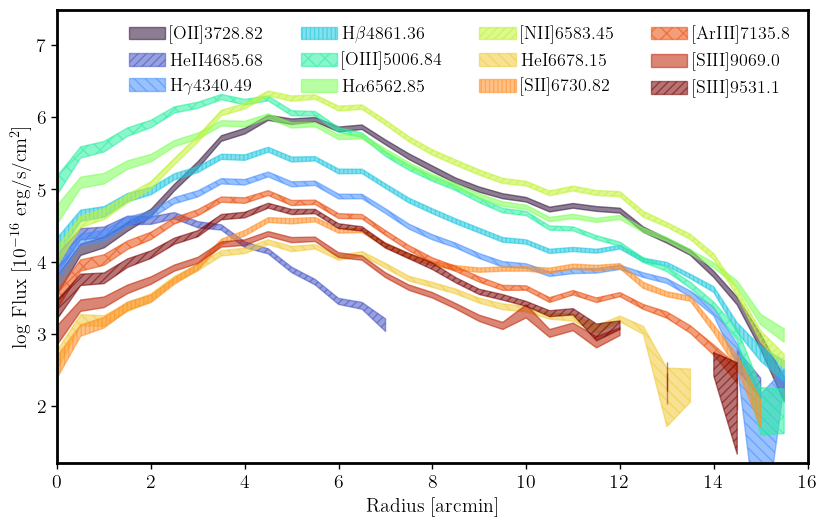

In [77]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']

for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10(a_flux-a_e_flux*0.5), np.log10(a_flux+a_e_flux*0.5), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux [10$^{-16}$ erg/s/cm$^2$]')
ax.set_xlim(0,16)
ax.set_ylim(1.21,7.49)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/rad_flux.pdf', facecolor='white')


[WARNING]: /tmp/ipykernel_726160/434283722.py:36: RuntimeWarning: invalid value encountered in divide
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\

[WARNING]: /tmp/ipykernel_726160/434283722.py:37: RuntimeWarning: invalid value encountered in divide
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \

[WARNING]: /tmp/ipykernel_726160/434283722.py:36: RuntimeWarning: invalid value encountered in log10
  ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\

[WARNING]: /tmp/ipykernel_726160/434283722.py:37: RuntimeWarning: invalid value encountered in log10
  np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \



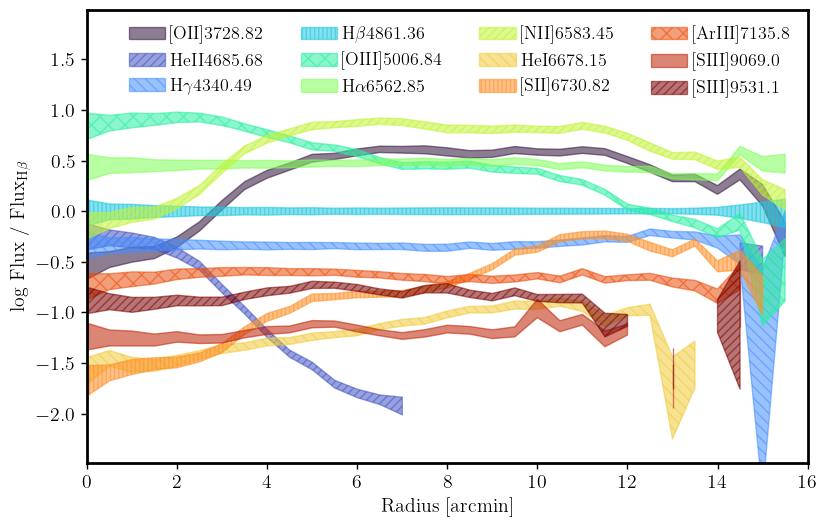

In [78]:
fig,ax = plt.subplots(1,1,figsize=(8.5,5.5))

d_r = 0.5
r_max = 25
scale = 60
ra_cen = 337.40479
dec_cen = -20.83775
elines_sec = ['flux_[OII]_3728.82','flux_HeII_4685.68','flux_Hgamma_4340.49',\
              'flux_Hbeta_4861.36','flux_[OIII]_5006.84',\
              'flux_Halpha_6562.85','flux_[NII]_6583.45','flux_HeI_6678.15',\
                'flux_[SII]_6730.82','flux_[ArIII]_7135.8','flux_[SIII]_9069.0',\
                    'flux_[SIII]_9531.1']

#cmap = plt.cm.Spectral
#cmap = plt.cm.nipy_spectral
#cmap = plt.cm.gist_earth
cmap = plt.cm.turbo
#cmap = plt.cm.gist_rainbow
colors = cmap(np.linspace(0, 1, len(elines_sec)))
hatches = ['','////', '\\\\\\', '||||', 'xx']
a_r_hb, a_flux_hb, a_e_flux_hb, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add,\
                                               'flux_Hbeta_4861.36', d_r, r_max, scale=scale)
for I,eline in enumerate(elines_sec):
    a_r, a_flux, a_e_flux, a_n = rad_pro(ra_cen, dec_cen, tab_DAP_add, eline, d_r, r_max, scale=scale)
    #a_flux = a_flux/1e6
    #a_e_flux = a_e_flux/1e6
    title=eline.replace('flux_','')
    title=title.replace('_','')
    title=title.replace('flux','')
    title=title.replace('alpha','$\\alpha$')
    title=title.replace('beta','$\\beta$')
    title=title.replace('gamma','$\\gamma$')    
    title=title.replace('delta','$\\delta$')
    title=title.replace('epsilon','$\\epsilon$')    
    hatch = hatches[I % len(hatches)]   
    ax.fill_between(a_r, np.log10((a_flux-a_e_flux*0.5)/a_flux_hb),\
                     np.log10((a_flux+a_e_flux*0.5)/a_flux_hb), \
        color=colors[I], hatch = hatch, alpha=0.55,label=title)
ax.legend(fontsize=13,loc='upper right',ncol=4)
ax.set_xlabel('Radius [arcmin]')
ax.set_ylabel('log Flux / Flux$_{\\rm H\\beta}$')
ax.set_xlim(0,16)
ax.set_ylim(-2.49,1.99)

plt.tight_layout()

#fig.colorbar(scat, cax=cax, label='km/s')#,label=fr'{title}')#,fontsize=21)
fig.savefig(f'figs/rad_rat.pdf', facecolor='white')


In [79]:
###############################################
# RSP PDF plots

#
# Stars with SN>25
#
SN_st = tab_DAP['med_flux_st']/tab_DAP['e_med_flux_st']
mask_SN = SN_st > 25
tab_DAP['SN_st'] = SN_st
tab_DAP_st = tab_DAP[mask_SN]


In [100]:
def ensure_files_from_links(dir_cache, file_links):
    dir_cache = Path(dir_cache)
    dir_cache.mkdir(parents=True, exist_ok=True)

    for fname, url in file_links.items():
        out = dir_cache / fname

        if out.exists():
            print(f"Found: {fname}")
            continue

        print(f"Downloading: {fname}")
        gdown.download(url=url, output=str(out), quiet=False)

        if out.exists():
            print(f"OK: {fname}")
        else:
            print(f"FAILED: {fname}")


# Example usage
FOLDER_URL = "https://drive.google.com/drive/folders/1LklOobJpTsgtTlBCswkXNuhmc856XAA4?usp=drive_link"


file_links = {
        "mstar-stlib-cl-108.fits.gz": "https://drive.google.com/uc?id=1RZkdshRNVi69TbVmow5sNdI2kAQokbWO",
        "mstar-stlib-n1235-SN5.fits.gz": "https://drive.google.com/uc?id=1e4vOLBBOSa6n69E4g3a3HMOhZyOPCs3f"
              }  

ensure_files_from_links(DIR_CACHE, file_links)


Found: mstar-stlib-cl-108.fits.gz
Found: mstar-stlib-n1235-SN5.fits.gz


In [81]:
#
# RSP plot
#

#
# We need to add the location of these files
#

rsp_file=f'{DIR_CACHE}/mstar-stlib-cl-108.fits.gz'
rsp_hdu=fits.open(rsp_file)
rsp_hdu.info()

Filename: cache//mstar-stlib-cl-108.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  SPECTRA       1 PrimaryHDU      13   (6351, 108)   float32   
  1  PARAMETERS    1 BinTableHDU     29   108R x 10C   [D, E, E, E, E, E, E, E, E, E]   
  2  ERROR         1 ImageHDU        14   (6351, 108)   float32   
  3  ORG_PARAM     1 BinTableHDU     31   1235R x 11C   [K, E, E, E, E, E, E, E, E, E, J]   
  4  PDF_TEFF_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  5  PDF_TEFF_MET    1 ImageHDU        17   (100, 100, 108)   float64   
  6  PDF_TEFF_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  7  PDF_MET_ALPHAM    1 ImageHDU        17   (100, 100, 108)   float64   
  8  PDF_MET_LOGG    1 ImageHDU        17   (100, 100, 108)   float64   
  9  PDF_LOGG_MET    1 ImageHDU        17   (100, 100, 108)   float64   


In [82]:
in_file=f'{DIR_CACHE}/mstar-stlib-n1235-SN5.fits.gz'
hdu_in=fits.open(in_file)
tab_in=Table(hdu_in[1].data)
#tab_in['TEFF']=np.log10(tab_in['TEFF'])
tab_in.columns
#plt.scatter(tab_in['TEFF'],tab_in['LOGG'])

<TableColumns names=('N_ST','TEFF','LOGG','MET','ALPHAM','FNORM','e_TEFF','e_LOGG','e_MET','e_ALPHAM')>

In [83]:
#from astropy.table import Table, vstack

def invert_transformation(tab_C_ord):
    # Extract unique RSP IDs from column names
    rsp_ids = [col.split('_')[-1] for col in tab_C_ord.colnames if col.startswith('Teff_rsp_')]
    rsp_ids = list(set(rsp_ids))  # Get unique RSP IDs

    # Initialize an empty list to store individual tables
    tables = []

    for I,rsp_id in enumerate(rsp_ids):
        # Extract columns for the current RSP ID
        cols_to_extract = ['id'] + [col for col in tab_C_ord.colnames if col.endswith(f'_{rsp_id}')]
        tab_tmp = tab_C_ord[cols_to_extract]

        # Rename columns to remove the RSP ID suffix
        for col in tab_tmp.colnames:
            if col != 'id':
                tab_tmp.rename_column(col, col.replace(f'_{rsp_id}', ''))

        # Add the RSP ID as a column
        tab_tmp['id_rsp'] = rsp_id
        #tab_tmp['id_fib'] = I
        # Append the table to the list
        tables.append(tab_tmp)

        # Combine all tables into a single table
    tab_COEFFS = vstack(tables)    
    tab_COEFFS['id_fib'] = [int(rsp.split(".")[1]) for rsp in tab_COEFFS['id']]
    tab_COEFFS['id_rsp'] = tab_COEFFS['id_rsp'].astype(int)
    tab_COEFFS.rename_column('id_rsp', 'rsp')
    tab_COEFFS.rename_column('Teff_rsp', 'TEFF')
    tab_COEFFS.rename_column('Log_g_rsp', 'LOGG')
    tab_COEFFS.rename_column('Fe_rsp', 'META')
    tab_COEFFS.rename_column('alpha_rsp', 'ALPHAM')
    tab_COEFFS.rename_column('W_rsp', 'COEFF')
    tab_COEFFS.rename_column('min_W_rsp', 'Min.Coeff')
    tab_COEFFS.rename_column('log_ML_rsp', 'log(M/L)')
    tab_COEFFS.rename_column('Av_rsp', 'AV')
    tab_COEFFS.rename_column('n_W_rsp', 'N.Coeff')
    tab_COEFFS.rename_column('e_W_rsp', 'Err.Coeff')


    tab_COEFFS.sort('rsp', reverse=False)
    return tab_COEFFS

# Example usage
# tab_COEFFS = invert_transformation(tab_C_ord)

In [84]:
tab_coeffs = invert_transformation(tab_DAP_st)

In [85]:
#tab_coeffs


In [86]:
print(len(tab_coeffs),len(tab_DAP_st))

216 2


In [87]:



def get_den_levels(den_map=None,conts=[0.99,0.65,0.40,0.0]):    
    vals=[]
    levels=[]
    den_map_p = den_map/np.max(den_map)
    for idx,cuts in enumerate(np.arange(0.00,1.0,0.01)):
        mask_now= den_map_p>cuts
        levels.append(cuts)
        vals.append(den_map_p[mask_now].sum()/den_map_p.sum())
    vals_cont=np.array(conts)
    levels_cont=np.interp(vals_cont,np.array(levels),np.array(vals))
    return levels_cont,den_map_p


def PDF_plot(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato',\
             pXhist = False, pYhist = False):
    (nz,ny,nx)=hdu_now.data.shape

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+(nx)*hdu_now.header['CDELT1'])#
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+(ny)*hdu_now.header['CDELT2'])

    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)

    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)

    levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
    p_cont_few=ax.contour(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent)
    p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_PDF,origin='lower', extent=extent,alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])


    xhist = den_map_few.sum(axis=0)
    yhist = den_map_few.sum(axis=1)
    divider = make_axes_locatable(ax)
    if (pXhist):
        axLSX = divider.append_axes("top", 0.35, pad=0.0, sharex=ax)
        axLSX.plot(np.linspace(xLims[0], xLims[1], len(xhist)), xhist, color=color_PDF)
        axLSX.axis('off')  # Remove the labels and the borders of the axis           
        axLSX.set_xlim(ax.get_xlim())
        axLSX.tick_params(labelbottom=False)
        axLSX.set_ylim(0.001*np.max(xhist),1.01*np.max(xhist))
    if (pYhist):
        axLSY = divider.append_axes("right", 0.35, pad=0.0, sharey=ax)
        axLSY.plot(yhist,np.linspace(yLims[0],yLims[1],len(yhist)),color=color_PDF)
        axLSY.set_ylim(ax.get_ylim())  
        axLSY.axis('off') 
        axLSY.set_xlim(0.001*np.max(yhist),1.01*np.max(yhist))
    return den_map,den_map_few


def PDF_get(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fib=None,tab_coeffs=None,\
             conts=[0.99,0.65,0.40,0.0],color_PDF='tomato'):
    (nz,ny,nx)=hdu_now.data.shape


    mask_fib = (tab_coeffs['id_fib']==n_fib)
    tab_now=tab_coeffs[mask_fib]
    den_map=np.average(hdu_now.data,axis=0)
    den_map_few=np.average(hdu_now.data,weights=tab_now['COEFF'],axis=0)
    return den_map_few



def PDF_plot_cl(ax=None,hdu_now=None,xlabel=None,ylabel=None,\
             n_fibs=None,\
             conts=[0.99,0.65,0.40,0.0],cmap='Spectral',c_cut=0.8):
    (nz,ny,nx)=hdu_now.data.shape
 
    xLims=(hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1'],\
           hdu_now.header['CRVAL1']-0.5*hdu_now.header['CDELT1']+nx*hdu_now.header['CDELT1'])
    yLims=(hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2'],\
           hdu_now.header['CRVAL2']-0.5*hdu_now.header['CDELT2']+ny*hdu_now.header['CDELT2'])
    extent=(xLims[0], xLims[1], yLims[0], yLims[1])
    

    den_map=np.average(hdu_now.data,axis=0)

    
    ax.imshow(den_map,extent=extent,cmap='Greys',origin='lower', aspect='auto')
    levels_cont,den_map_p=get_den_levels(den_map=den_map) 
    p_cont=ax.contour(den_map_p,levels_cont,colors='k',origin='lower', extent=extent)


    cmap_class = mpl.colormaps[cmap]
    colors = cmap_class(np.linspace(0, c_cut, len(n_fibs)))
    for I,n_fib in enumerate(n_fibs):
        den_map_few=hdu_now.data[n_fib,:,:]
        levels_cont,den_map_p=get_den_levels(den_map=den_map_few) 
        p_cont_few=ax.contour(den_map_p,levels_cont, colors=colors[I],origin='lower', extent=extent, label=f'\#{n_fib}')
        color_now = mpl.colors.to_hex(colors[I], keep_alpha=True)
        p_cont_few=ax.contourf(den_map_p,levels_cont, colors=color_now,origin='lower', extent=extent, alpha=0.3)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

In [88]:
print(np.unique(tab_coeffs['id_fib']))

id_fib
------
   519
  1144


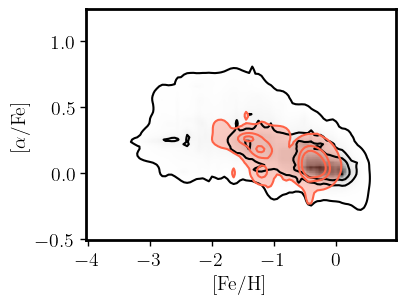

In [89]:
hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'

hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'
n_fib = 519

#tab_now = tab_coeffs[tab_coeffs['id_fib']==n_fib]
#print(hdu_now.data.shape)

#print(len(tab_now))


fig, ax = plt.subplots(figsize=(4,3))  
out = PDF_plot(ax=ax,hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=[0.85,0.40,0.0])  
#print(nx,ny)

0.15 0.15
0.15 0.45
0.45 0.15
0.45 0.45


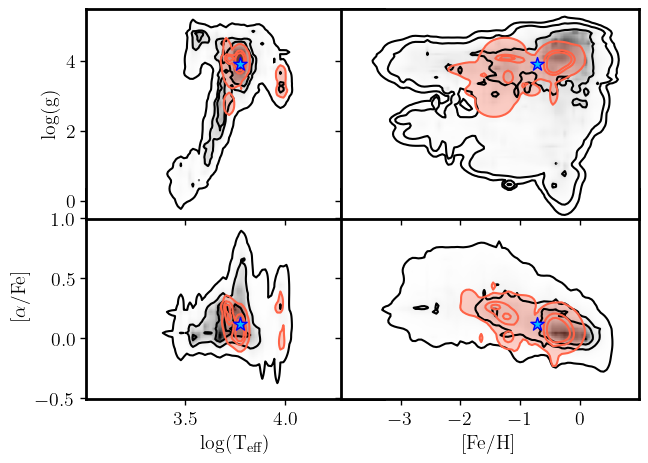

In [90]:

# n_fib=49
# n_fib=1808
#n_fib=224
#n_fib=1808





fig=plt.figure(figsize=(8.5,6))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]



hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=tab_coeffs,\
             conts=conts)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100

mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff'][mask_id]),tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['alpha'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'][mask_id],tab_DAP_st['Log_g'][mask_id],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


plt.show()


In [91]:
tab_coeffs[(tab_coeffs['id_fib'] == n_fib) & (tab_coeffs['COEFF'] > 0)]

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str9,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
4297.519,3.7086,4.1673,-0.0845,0.0906,0.0077,0.0072,13.9923,0.09,0.0077,0.0015,50,519
4297.519,3.9896,3.4372,-1.0824,0.1473,0.066,0.066,12.5171,0.09,0.066,0.0012,59,519
4297.519,3.7286,3.7955,-1.2244,0.1827,0.3457,0.3461,14.1247,0.09,0.3457,0.0056,81,519
4297.519,3.4987,0.4685,-0.2558,0.1046,0.0001,0.0001,13.4469,0.09,0.0001,0.0,86,519
4297.519,3.782,4.0151,-0.3244,0.0739,0.5574,0.559,13.4637,0.09,0.5574,0.0069,93,519
4297.519,3.7862,3.5489,-1.6002,0.2568,0.021,0.0195,14.6983,0.09,0.021,0.0041,105,519
4297.519,3.5473,4.5221,-0.3245,-0.0034,0.0021,0.0021,14.5471,0.09,0.0021,0.0001,106,519


In [92]:
mask_id = tab_DAP_st['fiberid'] == n_fib
tab_DAP_st['Teff','Log_g','Fe','alpha'][mask_id]

Teff,Log_g,Fe,alpha
float64,float64,float64,float64
5973.238399064939,3.8929907530218117,-0.710479679609033,0.12017550373511696


In [93]:
np.log10(tab_DAP_st['Teff'][mask_id])

3.7762098483034516


In [94]:
tab_coeffs[(tab_coeffs['id_fib'] == n_fib)]

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str9,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
4297.519,3.8065,4.0113,-2.0998,0.3273,0.0,0.0,14.6447,0.09,0.0,0.0,0,519
4297.519,3.7847,3.7481,-1.3644,0.3267,0.0,0.0,14.4138,0.09,0.0,0.0,1,519
4297.519,3.6626,1.7684,-1.3138,0.2218,0.0,0.0,13.753,0.09,0.0,0.0,2,519
4297.519,3.7833,4.2391,-0.2624,0.0914,0.0,0.0,13.4045,0.09,0.0,0.0,3,519
4297.519,3.6829,3.8664,0.02,0.0379,0.0,0.0,13.4159,0.09,0.0,0.0,4,519
4297.519,3.6615,4.5936,-0.0338,0.0238,0.0,0.0,13.9712,0.09,0.0,0.0,5,519
4297.519,3.7571,3.7104,-0.7526,0.1597,0.0,0.0,13.9862,0.09,0.0,0.0,6,519
4297.519,3.6112,1.292,-0.8048,0.1121,0.0,0.0,13.207,0.09,0.0,0.0,7,519
4297.519,3.7213,2.9467,-1.6334,0.2709,0.0,0.0,13.9755,0.09,0.0,0.0,8,519


In [95]:
from astropy.table import Table, vstack

# Group by 'rsp' and calculate the mean for each group
grouped_data = {}
for col in tab_coeffs.colnames:
    if col in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
        grouped_data[col] = []
    else:
        grouped_data[col] = []

unique_rsp = set(tab_coeffs['rsp'])
for rsp_value in unique_rsp:
    mask = tab_coeffs['rsp'] == rsp_value
    grouped_data['rsp'].append(rsp_value)
    for col in tab_coeffs.colnames:
        if col not in ['rsp', 'id']:  # Exclude non-numeric columns like 'id'
            grouped_data[col].append(tab_coeffs[col][mask].mean())
        elif col == 'id':  # For 'id', concatenate unique values as strings
            grouped_data[col].append(','.join(tab_coeffs[col][mask]))

# Create a new table with the averaged data
output_table = Table(grouped_data)
output_table['id'] = 1
output_table['id_fib'] = 1


In [96]:
output_table

id,TEFF,LOGG,META,ALPHAM,COEFF,Min.Coeff,log(M/L),AV,N.Coeff,Err.Coeff,rsp,id_fib
str18,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64
1,3.8065,4.0113,-2.0998,0.3273,0.0,0.0,14.6447,0.075,0.0,0.0,0,1.0
1,3.7847,3.7481,-1.3644,0.3267,0.0,0.0,14.4138,0.075,0.0,0.0,1,1.0
1,3.6626,1.7684,-1.3138,0.2218,0.0,0.0,13.753,0.075,0.0,0.0,2,1.0
1,3.7833,4.2391,-0.2624,0.0914,0.0,0.0,13.4045,0.075,0.0,0.0,3,1.0
1,3.6829,3.8664,0.02,0.0379,0.0,0.0,13.4159,0.075,0.0,0.0,4,1.0
1,3.6615,4.5936,-0.0338,0.0238,0.0,0.0,13.9712,0.075,0.0,0.0,5,1.0
1,3.7571,3.7104,-0.7526,0.1597,0.0,0.0,13.9862,0.075,0.0,0.0,6,1.0
1,3.6112,1.292,-0.8048,0.1121,0.0,0.0,13.207,0.075,0.0,0.0,7,1.0
1,3.7213,2.9467,-1.6334,0.2709,0.0,0.0,13.9755,0.075,0.0,0.0,8,1.0


In [97]:
rc.update({'font.size': 19,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 19,\
           'ytick.labelsize' : 19,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })

[WARNING]: /tmp/ipykernel_726160/4290924078.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()



0.15 0.15
0.15 0.45
0.45 0.15
0.45 0.45


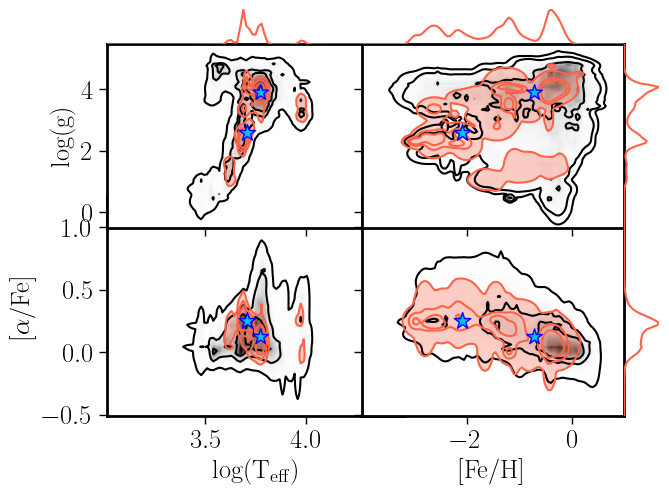

In [98]:

# n_fib=49
# n_fib=1808
n_fib=1
#n_fib=1808





fig=plt.figure(figsize=(8.5,6.25))
left=[0.15,0.45]
width=[0.35,0.35]
axLS=[]
for x in left:
    for y in left:
        print(x,y)
        axLS.append(fig.add_axes([x, y, 0.35, 0.35]))

axLS[1].set_xticklabels([])
axLS[2].set_yticklabels([])
axLS[3].set_xticklabels([])
axLS[3].set_yticklabels([])
#conts=[0.95,0.65,0.40,0.0]
#
# 
#conts=[0.99,0.65,0.35,0.0]
conts=[0.95,0.0]





hdu_now=rsp_hdu['PDF_TEFF_LOGG']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'log(g)'
den_map,den_map_few = PDF_plot(ax=axLS[1],hdu_now=hdu_now,xlabel='',ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts, pXhist=True)  


hdu_now=rsp_hdu['PDF_TEFF_ALPHAM']
xlabel=r'log(T$_{\rm eff}$)'
ylabel=r'[$\alpha$/Fe]'
PDF_plot(ax=axLS[0],hdu_now=hdu_now,xlabel=xlabel,ylabel=ylabel,\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts)  


hdu_now=rsp_hdu['PDF_MET_ALPHAM']
xlabel=r'[Fe/H]'
ylabel=r'[$\alpha$/Fe]'

PDF_plot(ax=axLS[2],hdu_now=hdu_now,xlabel=xlabel,ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pYhist=True)  

hdu_now=rsp_hdu['PDF_MET_LOGG']
xlabel=r'[Fe/H]'
ylabel=r'log(g)'

PDF_plot(ax=axLS[3],hdu_now=hdu_now,xlabel='',ylabel='',\
             n_fib=n_fib,tab_coeffs=output_table,\
             conts=conts,pXhist=True,pYhist=True)  

axLS[0].set_xlim(3.01,4.49)
axLS[1].set_xlim(3.01,4.49)

axLS[2].set_xlim(-3.99,0.99)
axLS[3].set_xlim(-3.99,0.99)

color='deepskyblue'
ecolor='blue'
size=100
size = (tab_DAP_st['SN_st'])*5
mask_id = tab_DAP_st['fiberid'] == n_fib
axLS[1].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[0].scatter(np.log10(tab_DAP_st['Teff']),tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[2].scatter(tab_DAP_st['Fe'],tab_DAP_st['alpha'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)
axLS[3].scatter(tab_DAP_st['Fe'],tab_DAP_st['Log_g'],\
                color=color,zorder=1000,marker='*',s=size,edgecolor=ecolor)


#axLS[0].scatter(tab_in['TEFF'],tab_in['ALPHAM'],color='green',s=5)

#axLS[1].scatter(tab_in['TEFF'],tab_in['LOGG'],color='green')
#print(tab_in['TEFF'][n_fib],tab_in['LOGG'][n_fib])
figname=f'PDF_rsp_Helix_SN25'
fig.tight_layout()
fig.savefig('figs/'+figname+".pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")

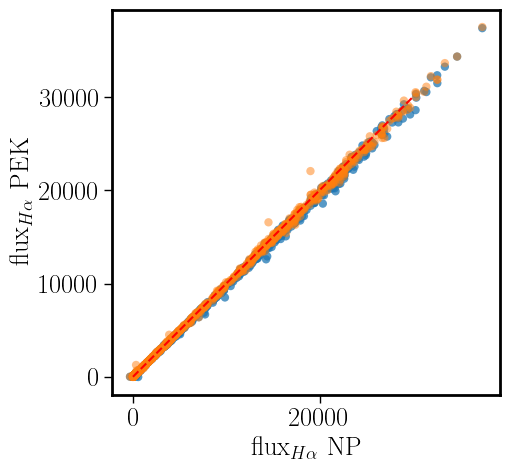

In [99]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
ax.scatter(tab_DAP['flux_Halpha_6562.85'],tab_DAP['flux_pek_6562.85'],alpha=0.75,edgecolor='none')
ax.scatter(tab_DAP['flux_Halpha_6562.85'],tab_DAP['flux_pe_6562.85'],alpha=0.5,edgecolor='none')
ax.set_xlabel(r'flux$_{H\alpha}$ NP')
ax.set_ylabel(r'flux$_{H\alpha}$ PEK')
ax.plot([0.01,30000],[0.01,30000],color='red',ls='--')